# 开篇

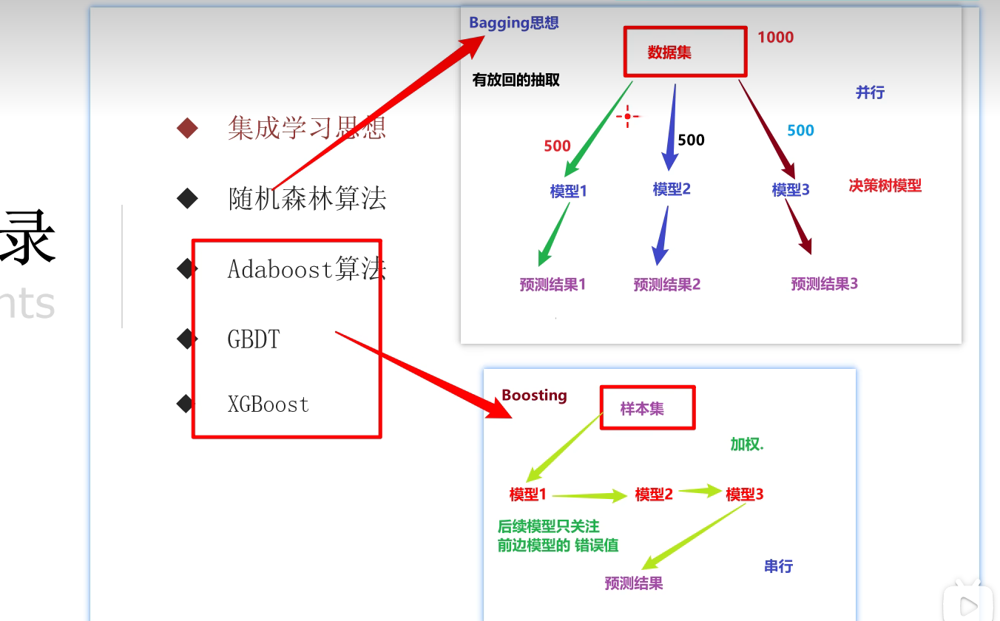

* Bagging思想：三个臭皮匠，顶个诸葛亮 原始数据1000条 每个模型是相同的，各抽500 他们可能各有交集。
* 通过各自的数据预测结果 假设是线性 则取三个模型预测值的平均值 如果是分类 则是投票 哪个预测的多选哪个

* Boosting思想：加权逐层递减 假设开始是1000条数据 模型一预测对800 那么模型二就是关注剩下的200，假设模型二预测对150， 模型三就关注模型二预测错的50
* 最后通过加权投票 得出结果

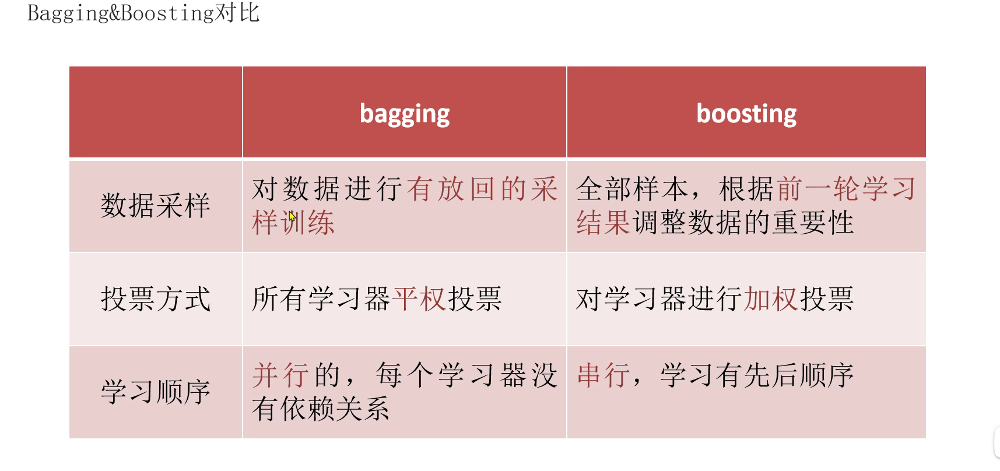

# 随机森林

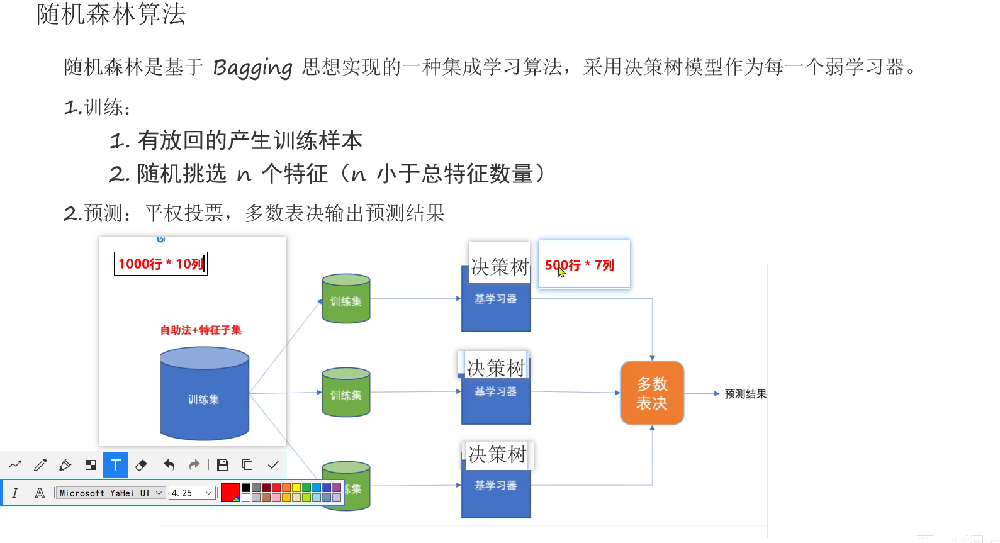

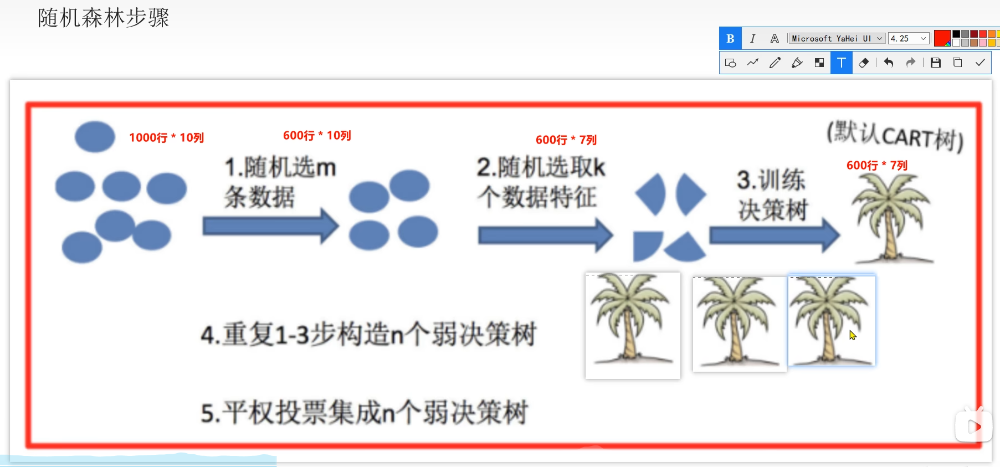

**“随机”为了多样性（防过拟合），“放回”为了样本量（防欠拟合）。**
我们可以把这两个机制的底层逻辑再拆解得更深一点：
### 1. 随机 ＝ 追求“和而不同”（防过拟合）
随机就是为了让模型产生**差异性**。
 * 在集成学习中，如果所有的基分类器（每棵树）都一模一样，那把它们组合起来就毫无意义。
 * 通过**随机抽取样本**（以及随机选择特征），确保了每棵树都是一个偏科的“专家”。有的树对A类特征敏感，有的树对B类样本熟悉。
 * 最终通过投票，把这些差异化的声音结合起来，就能抵消掉单棵树的偏见和噪声，从而**大幅度降低过拟合**。
### 2. 放回 ＝ 保证“兵马充足”（防欠拟合）
你理解的“放回是为了防止欠拟合”非常高级。为什么不放回就会欠拟合呢？
 * 如果我们要追求差异性，又采用**不放回抽样**，那为了让每棵树的数据不一样，我们就只能把数据“切块”（比如 1000 条数据，分给 10 棵树，每棵树只能分到 100 条）。
 * 每棵树只看 10% 的数据，信息量严重不足，这就导致每棵树都“营养不良”，训练出来的模型势必结构简单、能力低下，也就是**欠拟合**。
 * 而**有放回抽样（Bootstrap）**完美解决了这个矛盾：它既能保证每棵树抽到的数据集是独立的（有差异），又能让每棵树的训练集样本量**和原始数据集一样大**（都是 1000 条）。数据量管够，树才能长得枝繁叶茂，从而**防止了欠拟合**。
### 总结一个黄金公式：
 * **不随机 -> 树树相同 -> 森林退化成单棵树 -> 过拟合**
 * **不放回 -> 每棵树数据量骤减 -> 树长不大 -> 欠拟合**
所以，“随机且有放回”是随机森林在**多样性**与**准确率**之间找到的最佳平衡点。

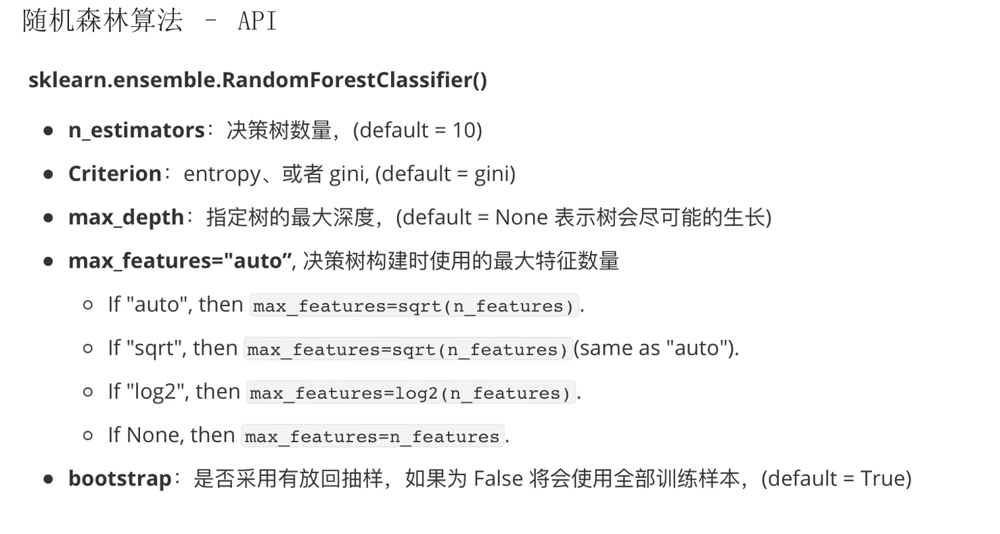

Criterion :用基尼值 还是信息熵 默认基尼值

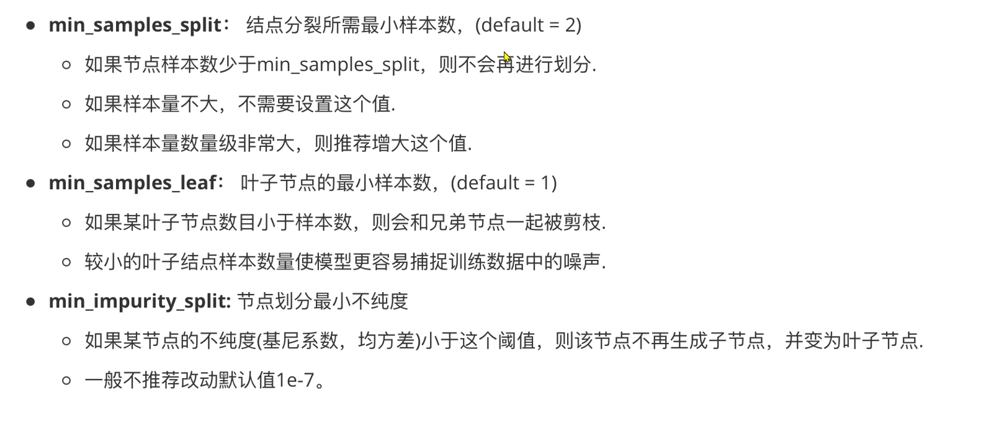

* split 表示能不能再分叉样本数小于某个值不能分叉了
* leaf  表示该节点能不能活着 如果该节点样本数小于某个值就连同它的兄弟节点一起剪掉
* 第三个是新版变为min_impurity_decrease 它是用于判断分裂后纯度有没有提升 如果分裂后纯度提升的阈值小于设置的 就不再分裂

## 随机森林代码

In [ ]:
"""
案例:
    演示 集成学习之 Bagging思想 随机森林算法 代码. 分类直接投票 回归直接取几个弱学习器的平均值

集成学习:
    概述:
        把多个弱学习器 组成 1个强学习器的过程 -> 集成学习.
    思想:
        Bagging思想:
            1. 有放回的随机抽样.
            2. 平权投票.
            3. 可以并行执行.

        Boosting思想:
            1. 每次训练都会使用全部样本.
            2. 加权投票 -> 预测正确:权重降低, 预测错误: 权重增加.
            3. 只能串行执行.
    Bagging思想代表:
        随机森林算法.

随机森林算法:
    1. 每个弱学习器都是 CART树(必须是二叉树)
    2. 有放回的随机抽样, 平权投票, 并行执行.
"""

# 导包
import pandas as pd
from sklearn.model_selection import train_test_split        # 切分训练集和测试集
from sklearn.tree import DecisionTreeClassifier             # 决策树
from sklearn.ensemble import RandomForestClassifier         # 随机森林算法(分类器)
from sklearn.model_selection import GridSearchCV            # 网格搜索


# 1. 加载数据.
df = pd.read_csv('./data/train.csv')
# df.info()

# 2. 数据的预处理.
# 2.1 抽取 特征 和 标签.
x = df[['Pclass', 'Sex', 'Age']].copy()     # 船舱等级, 性别, 年龄
y = df['Survived']

# 2.2 空值处理, 用Age列的平均值 填充Age列的空值
x['Age'] = x['Age'].fillna(x['Age'].mean())

# 2.3 热编码处理.
x = pd.get_dummies(x)

# 2.4 划分训练集 和 测试集.
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=23)


# 3. 特征工程. 此处略.

# 4. 模型训练, 预测, 评估.
# 场景1: 单一决策树.
# 4.1 创建 决策树对象, 演示: 单一的决策树效果.
estimator1 = DecisionTreeClassifier()
# 4.2 模型训练.
estimator1.fit(x_train, y_train)
# 4.3 预测.
y_pred = estimator1.predict(x_test)
print(f'预测值为: {y_pred}')
# 4.4 评估.
print(f'决策树模型的准确率为: {estimator1.score(x_test, y_test)}')        #  0.8044692737430168
print('-' * 23)

# 场景2: 随机森林算法 -> 采用默认参数.
# 4.1 创建 随机森林对象, 演示: 多个的决策树(Bagging思想)效果.
estimator2 = RandomForestClassifier()       # n_estimators=100, max_depth=None
# 4.2 模型训练.
estimator2.fit(x_train, y_train)
# 4.3 预测.
y_pred2 = estimator2.predict(x_test)
print(f'预测值为: {y_pred2}')
# 4.4 评估
print(f'随机森林模型的准确率为: {estimator2.score(x_test, y_test)}')
print('-' * 23)


# 场景3: 随机森林算法 -> 采用网格搜索.
# 4.1 创建 随机森林对象, 演示: 多个的决策树(Bagging思想)效果.
estimator3 = RandomForestClassifier(random_state=22)
# 4.2 参数准备.
params = {'n_estimators': [30, 50, 60, 90, 110], 'max_depth': [2, 3, 5, 7]}
# 4.3 创建网格搜索对象 结合 交叉验证.
gs_estimator = GridSearchCV(estimator3, param_grid=params, cv=2)
# 4.4 模型训练.
gs_estimator.fit(x_train, y_train)
# 4.5 预测.
y_pred3 = gs_estimator.predict(x_test)
print(f'预测值为: {y_pred3}')
# 4.6 评估
print(f'随机森林模型的准确率为: {gs_estimator.score(x_test, y_test)}')
# 4.7 获取 最佳参数.
print(f'最佳参数为: {gs_estimator.best_params_}')

# Adaboost算法

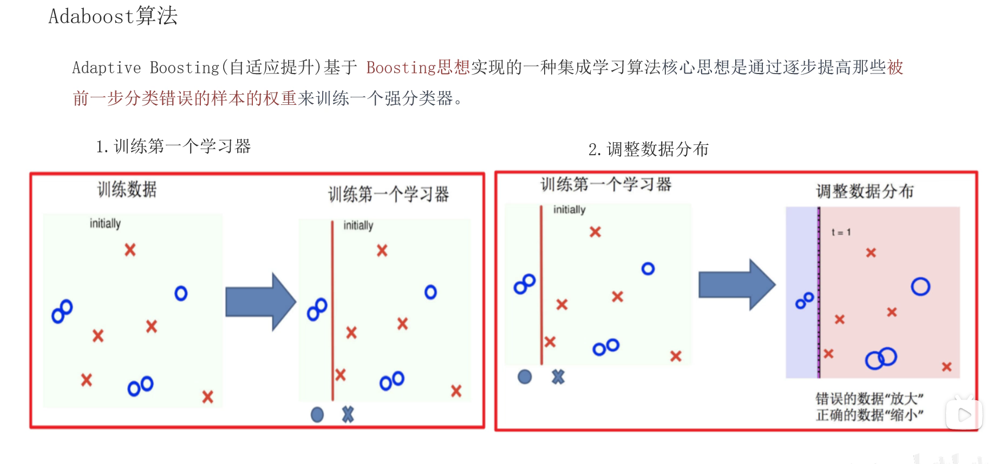

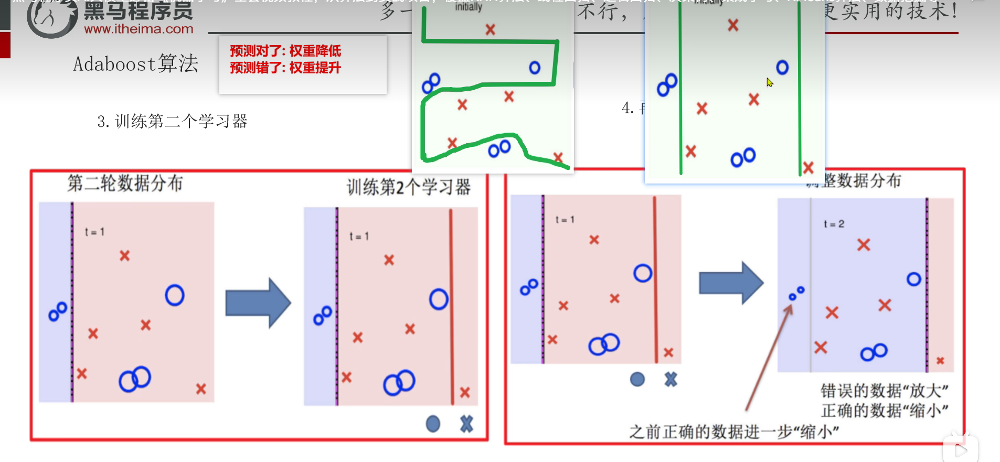

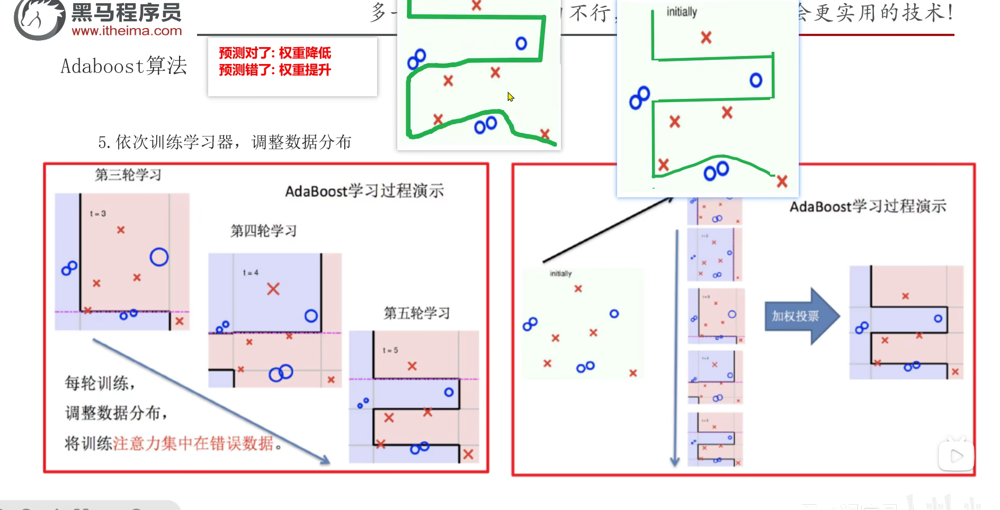

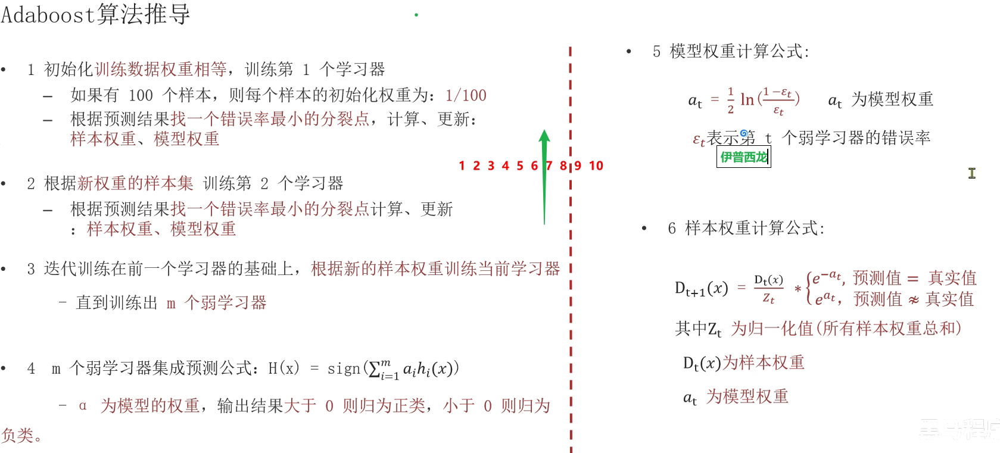

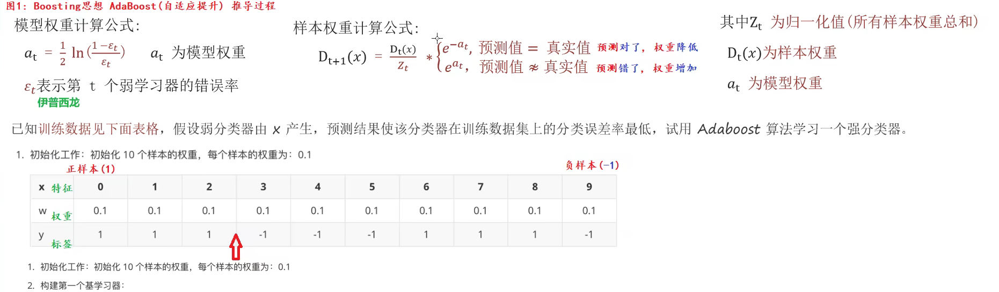

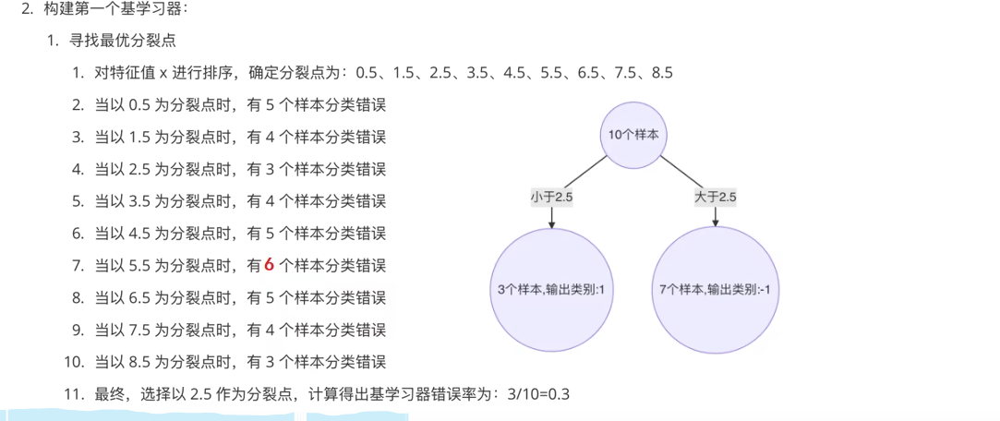

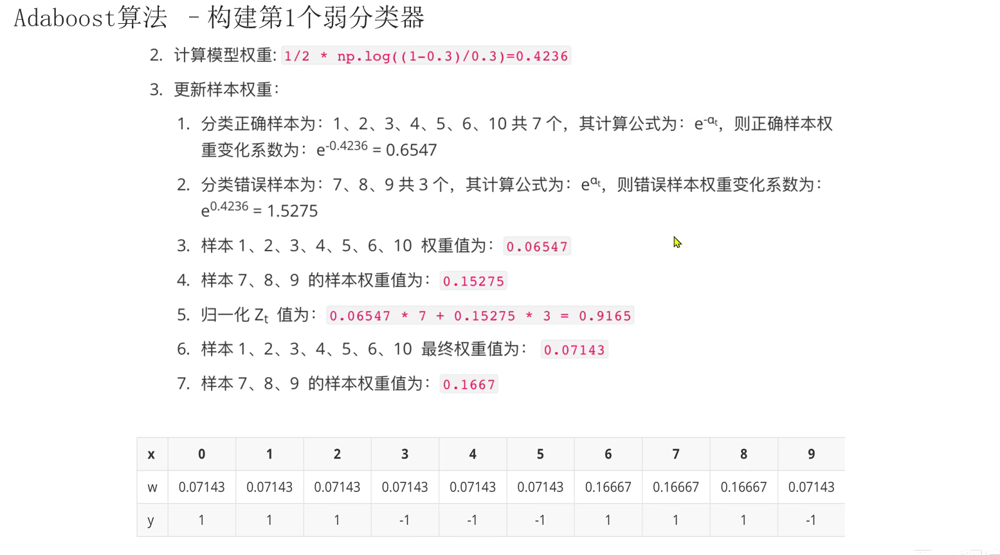

* 先求 ε 确定分裂点，分裂点左为正、右为负（或反之），根据标签 y 来判断有多少错误的分类，选择其中错误样本权重之和最少的分裂点。计算错误率（错误样本的权重相加）=0.3，由ε 求得 a。
* e 的 -+a 次方乘以旧的权重（0.1）是样本临时权重：错的用 e^a 次方（放大权重），正确用 e^-a 次方（缩小权重）。七个对的临时权重 + 三个错的临时权重，它们相加的总和就是 Z（归一化因子）。
* 用每个样本的临时权重除以 Z，就可以求得新的样本权重。

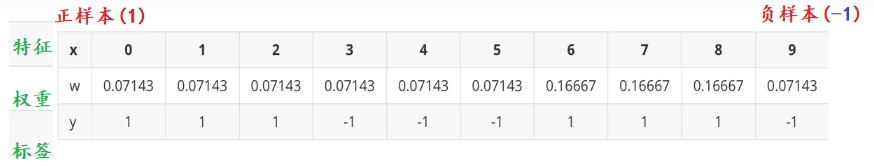

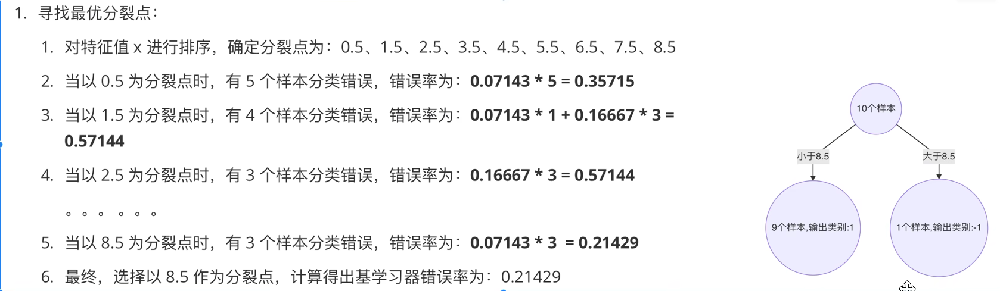

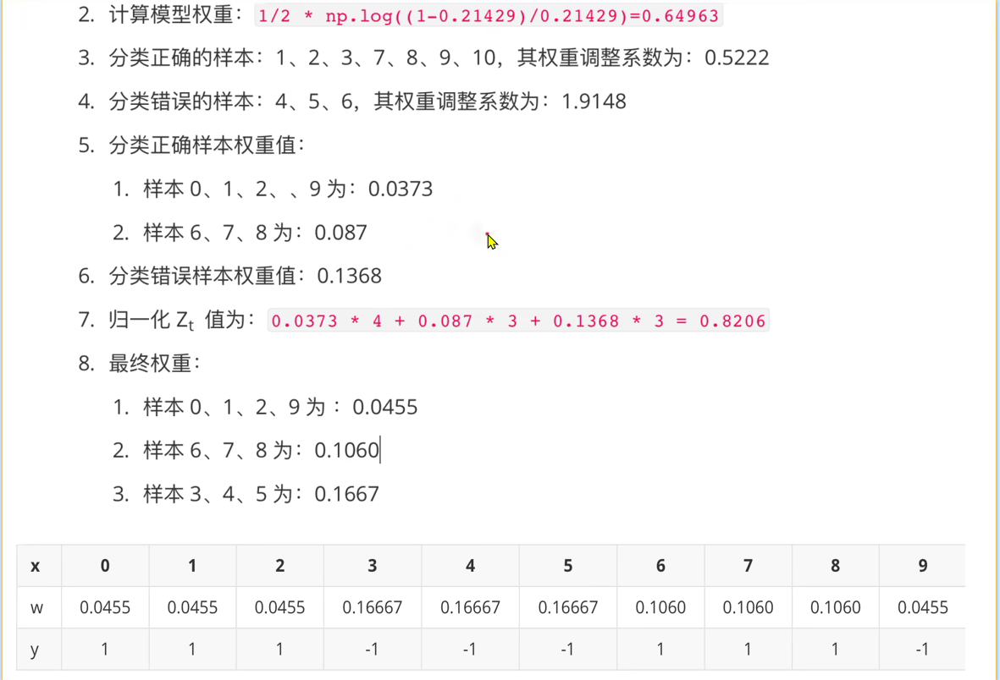

* 正确的权重值有两类 虽然都为正确 但是他们的样本权重不一样 所以分成两类

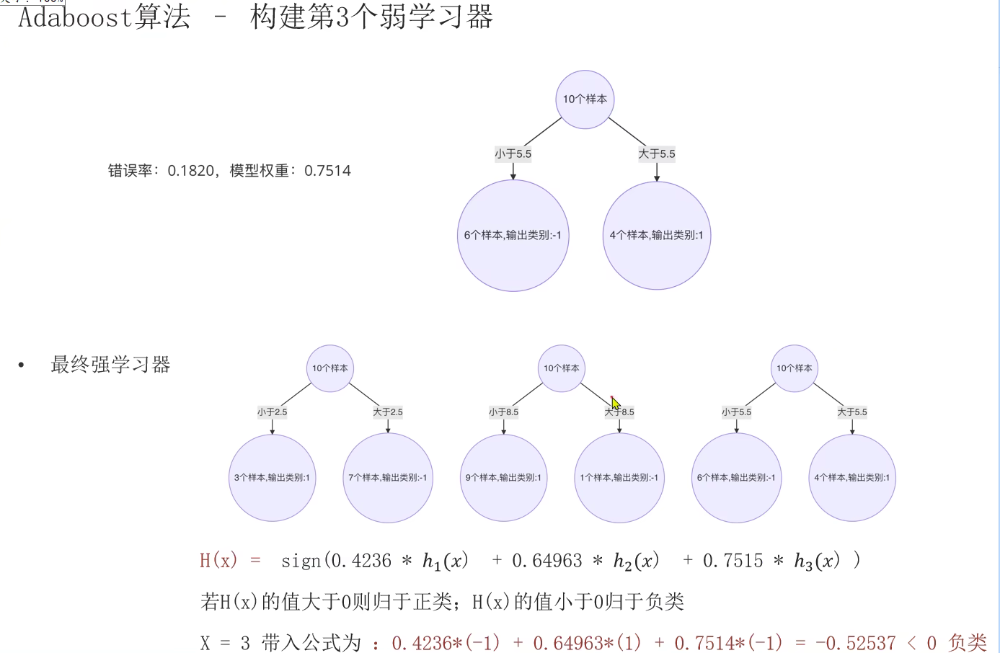

* 分割线左为正或负都要计算 将其中最小的设为错误率

 # Boosting思想例子

In [3]:
"""
案例:
    演示AdaBoost算法 之  葡萄酒案例.

AdaBoost算法介绍:
    它属于 Boosting思想, 即: 串行执行, 每次使用全部样本, 最后 加权投票.
    原理:
        1. 使用全部样本, 通过决策树模型(第1个弱分类器)进行训练, 获取结果.
            思路:
                预测正确 -> 权重下降
                预测错误 -> 权重上升
        2. 把第1个弱分类器的处理结果, 交给第2个弱分类器进行训练, 获取结果.
            思路:
                预测正确 -> 权重下降
                预测错误 -> 权重上升
        3. 依次类推, 串行执行, 直至获取最终结果.
"""

# 导包
import pandas as pd
from sklearn.preprocessing import LabelEncoder          # 标签编码器
from sklearn.model_selection import train_test_split    # 训练集、测试集分割
from sklearn.tree import DecisionTreeClassifier         # 决策树分类器
from sklearn.ensemble import AdaBoostClassifier         # AdaBoost分类器 -> 集成学习Boosting思想
from sklearn.metrics import accuracy_score              # 模型评估 -> 正确率


# 1. 获取数据集
df_wine = pd.read_csv('./data/wine0501.csv')
# df_wine.info()

# print(df_wine['Class label'].unique())    # [1, 2, 3]   葡萄酒类别有3种. 但是决策树只能识别 二叉树.

# 2. 数据预处理
# 2.1 从 标签列(Class label)中, 过滤掉 1类别, 剩下 2, 3 类别.
df_wine = df_wine[df_wine['Class label'] != 1]
# print(df_wine['Class label'].unique())      # [2, 3]

# 2.2 获取特征列 和 标签列.
x = df_wine[['Alcohol', 'Hue']]     # 酒精 和 色泽
y = df_wine['Class label']          # 标签列.

# 2.3 打印数据.
# print(x[:5])
# print(y[:5])

# 2.4 通过 标签编码器, 把 标签列, 转换为 数值列.
le = LabelEncoder()
y = le.fit_transform(y)
# print(y)      # [2, 3] -> [0, 1]

# 2.5 训练集、测试集分割.
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=23, stratify=y)

# 3. 特征工程, 此处略.

# 4. 模型训练, 预测, 评估.
# 场景1: 单一决策树 -> 充当弱分类器
# 4.1 创建模型对象
estimator1 = DecisionTreeClassifier(max_depth=3)
# 4.2 训练模型
estimator1.fit(x_train, y_train)
# 4.3 模型预测
y_pre1 = estimator1.predict(x_test)
print(f'单一决策树预测结果: {y_pre1}')
# 4.4 模型评估
print(f'单一决策树预测正确率: {accuracy_score(y_test, y_pre1)}')      # 0.91666666


# 场景2: AdaBoost -> 集成学习, CART树, 200棵
# 4.1 创建模型对象
# 参1: 弱分类器(决策树对象), 参2: 弱分类器个数, 参3: 学习率, 参4: 集成算法
estimator2 = AdaBoostClassifier(estimator=estimator1, n_estimators=200, learning_rate=0.1, algorithm='SAMME') #多分类：SAMME输出一个确定的 --苹果 ，SAMME.R输出概率 0.6苹果 0.4橙子
# 4.2 训练模型
estimator2.fit(x_train, y_train)
# 4.3 模型预测
y_pre2 = estimator2.predict(x_test)
print(f'AdaBoost集成学习预测结果: {y_pre2}')
# 4.4 模型评估
print(f'AdaBoost集成学习预测正确率: {accuracy_score(y_test, y_pre2)}')




单一决策树预测结果: [0 0 1 0 1 0 0 1 0 1 1 0 1 0 1 0 1 0 0 0 0 0 1 1]
单一决策树预测正确率: 0.9166666666666666


D:\learn\code\pycode\MachineLearn\.venv\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


AdaBoost集成学习预测结果: [0 0 1 0 1 1 0 1 0 1 1 0 1 0 1 0 1 0 0 0 0 0 1 1]
AdaBoost集成学习预测正确率: 0.9583333333333334


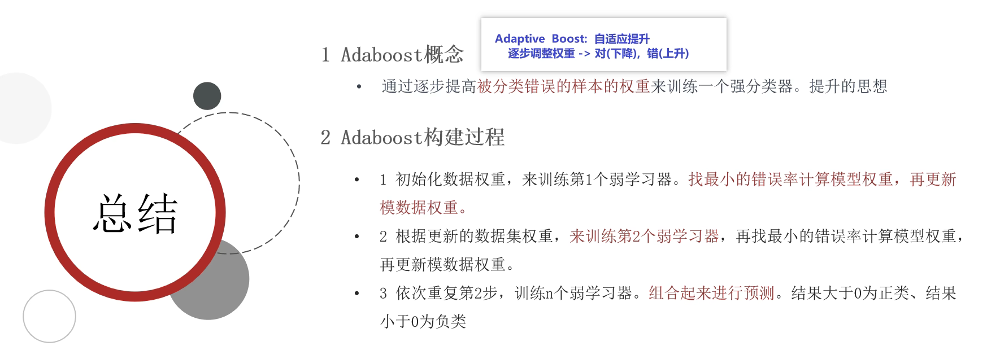

# GBDT算法

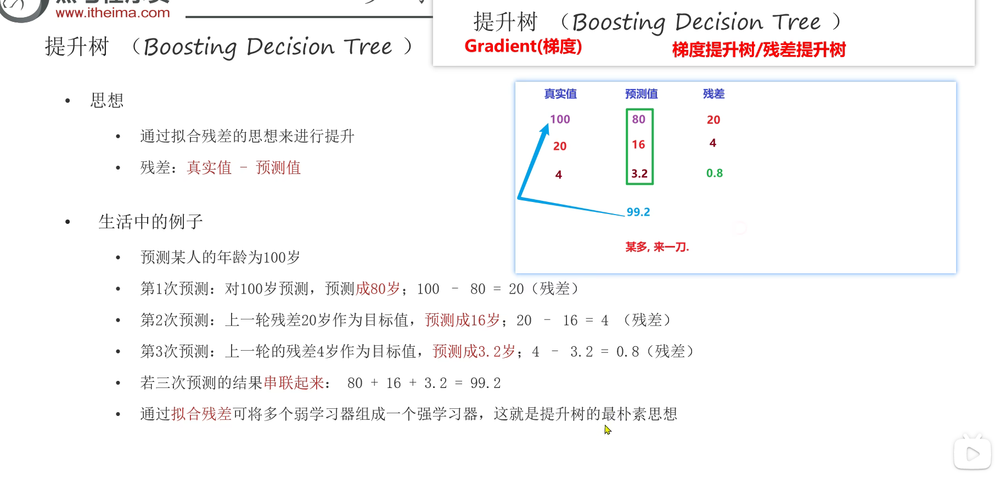

## 核心推导过程：为什么平方损失下“负梯度”等于“残差”？

在梯度提升决策树（GBDT）中，我们的目标是通过迭代让每轮的损失最小化。以下是严格的数学推导过程。

---

### 1. 定义加法模型与损失函数

假设我们第 $t$ 轮的总目标函数（强学习器）为 $f_t(x)$，它由上一轮的强学习器 $f_{t-1}(x)$ 加上本轮要学习的弱学习器（基模型） $h_t(x)$ 组成：

$$f_t(x) = f_{t-1}(x) + h_t(x)$$

若采用**平方损失函数（Squared Loss）**，对于某一个样本点 $(x_i, y_i)$，其损失函数定义为：

$$L(y_i, f_t(x_i)) = \frac{1}{2} (y_i - f_t(x_i))^2$$

> **注**：在前面添加系数 $\frac{1}{2}$ 是数学上的常规处理，专门用于抵消后续求导带来的系数 $2$，不影响极值优化的方向。

---

### 2. 计算梯度（对当前预测值求偏导）

将当前的预测值 $f_t(x_i)$ 视为自变量，对损失函数求偏导数。根据复合函数求导的链式法则（Chain Rule）：

$$\frac{\partial L(y_i, f_t(x_i))}{\partial f_t(x_i)} = \frac{1}{2} \cdot 2 \cdot (y_i - f_t(x_i)) \cdot \frac{\partial (y_i - f_t(x_i))}{\partial f_t(x_i)}$$

$$\frac{\partial L(y_i, f_t(x_i))}{\partial f_t(x_i)} = (y_i - f_t(x_i)) \cdot (-1)$$

化简后得到**梯度（Gradient）**公式：

$$\frac{\partial L(y_i, f_t(x_i))}{\partial f_t(x_i)} = -(y_i - f_t(x_i))$$

---

### 3. 计算负梯度（损失下降的最快方向）

为了使用梯度下降法最小化损失，我们需要计算**负梯度（Negative Gradient）**方向：

$$-\left[ \frac{\partial L(y_i, f_t(x_i))}{\partial f_t(x_i)} \right] = y_i - f_t(x_i)$$

在实际算法训练中，当我们要拟合第 $t$ 棵树 $h_t(x)$ 时，当前步的总预测值 $f_t(x_i)$ 尚未计算出来。因此，我们站在上一轮迭代完成的基础上，计算当前损失函数的负梯度值（即令 $f_t(x_i) \approx f_{t-1}(x_i)$）：

$$-\left[ \frac{\partial L(y_i, f(x_i))}{\partial f(x_i)} \right]_{f(x)=f_{t-1}(x)} = y_i - f_{t-1}(x_i)$$

---

## 结论

最终推导出的负梯度表达式为：

$$y_i - f_{t-1}(x_i)$$

该公式表示 **真实值（$y_i$） - 上一轮累计的预测值（$f_{t-1}(x_i)$）**，即**残差（Residual）**。

* **核心意义**：在平方损失函数下，GBDT 的“负梯度方向”在数学上完全等价于“残差”。因此，GBDT 每一轮利用新树去拟合负梯度的过程，在回归问题下就是直接拟合上一轮留下来的残差。

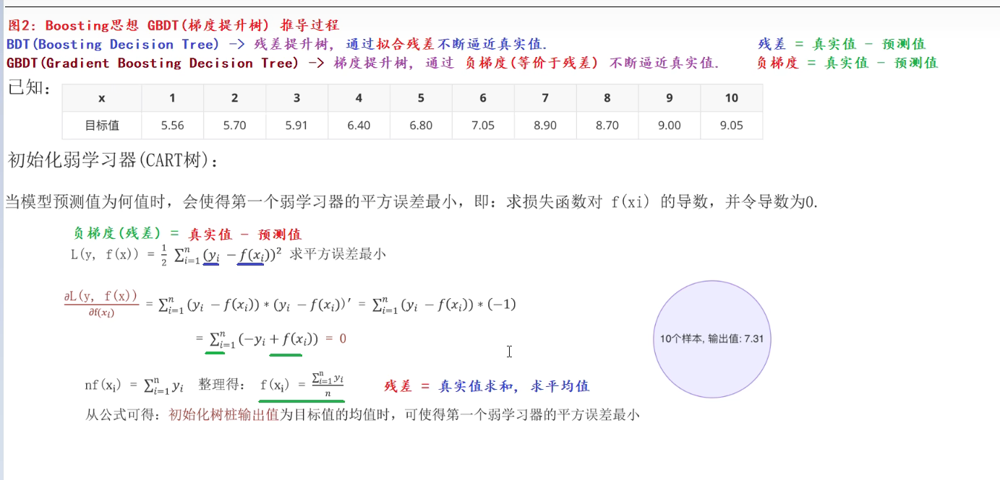

# GBDT 回归算法：初始化弱学习器（CART树）原理总结

在 GBDT（梯度提升决策树）解决回归问题时，模型的第一步是**初始化第一个弱学习器 $f_0(x)$**。这个过程本质上是在不考虑任何特征分叉的情况下，寻找一个最优的常数 $c$，使得所有样本的初始总损失最小。

---

## 一、 核心数学推导

### 1. 定义目标（损失函数）
我们使用**平方误差损失函数（MSE）**来衡量模型的预测效果。假设初始时，模型对所有样本的预测值都给出一个相同的常数 $c$，即 $f(x_i) = c$。

总损失函数公式为：
$$L(y, c) = \frac{1}{2} \sum_{i=1}^{n} (y_i - c)^2$$

* $y_i$：第 $i$ 个样本的真实目标值。
* $c$：初始化的统一预测值（常数）。
* $n$：样本总数。
* $\frac{1}{2}$：为了在后续求导时约掉平方项出的系数 $2$，方便化简。

### 2. 求导并令导数为 0（寻找极小值）
为了找到让总损失 $L$ 最小的常数 $c$，我们需要对 $c$ 求偏导，并令导数等于 0：
$$\frac{\partial L}{\partial c} = \sum_{i=1}^{n} (y_i - c) \cdot (-1) = 0$$

将 $(-1)$ 乘入各项并展开求和符号：
$$\sum_{i=1}^{n} (-y_i + c) = 0$$
$$\sum_{i=1}^{n} c - \sum_{i=1}^{n} y_i = 0$$

### 3. 得出结论
因为 $c$ 是一个常数， $n$ 个 $c$ 相加即等于 $n \cdot c$。因此公式可以写为：
$$n \cdot c = \sum_{i=1}^{n} y_i$$

两边同时除以 $n$，得到最终的初始化输出值：
$$c = \frac{\sum_{i=1}^{n} y_i}{n}$$

**数学结论：** 初始化的预测值 $c$，恰好等于所有样本真实目标值 $y_i$ 的**算术平均数**。

---

## 二、 结合实例直观理解

以拥有 10 个样本的表格为例：

| 样本 $x$ | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 |
| :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- |
| **目标值 $y$** | 5.56 | 5.70 | 5.91 | 6.40 | 6.80 | 7.05 | 8.90 | 8.70 | 9.00 | 9.05 |

1. **样本数 $n$** = 10
2. **目标值总和 $\sum y_i$** = $5.56 + 5.70 + \dots + 9.05 = 73.07$
3. **计算初始预测值 $c$**：
   $$c = \frac{73.07}{10} = 7.307 \approx 7.31$$

**结论：** 截图中右下角标注的 `10个样本，输出值: 7.31` 就是这样通过计算平均数得到的。

---
## 三、 核心要点：为什么所有样本的初始预测值 $f(x_i)$ 全都一样？

1. **这是一棵“没有分叉”的树（根节点树）**：
   此时模型还没有开始根据特征（如 $x > 5$）去切分数据。所有 10 个样本都被堆在同一个叶子节点里，因此它们**共享完全相同的预测值（即 7.31）**。
2. **第二棵树开始，预测值才会产生差异**：
   * 有了初始预测值 $7.31$ 后，模型会计算每个样本的**负梯度（残差）**（$\text{真实值} - \text{预测值}$）。
     * 样本 1 的残差 = $5.56 - 7.31 = -1.75$
     * 样本 10 的残差 = $9.05 - 7.31 = +1.74$
   * 从第二棵树开始，GBDT 就会利用样本的特征去拟合这些**各不相同的残差**，树才会长出分支，不同样本的最终累计预测值才会真正拉开差距。

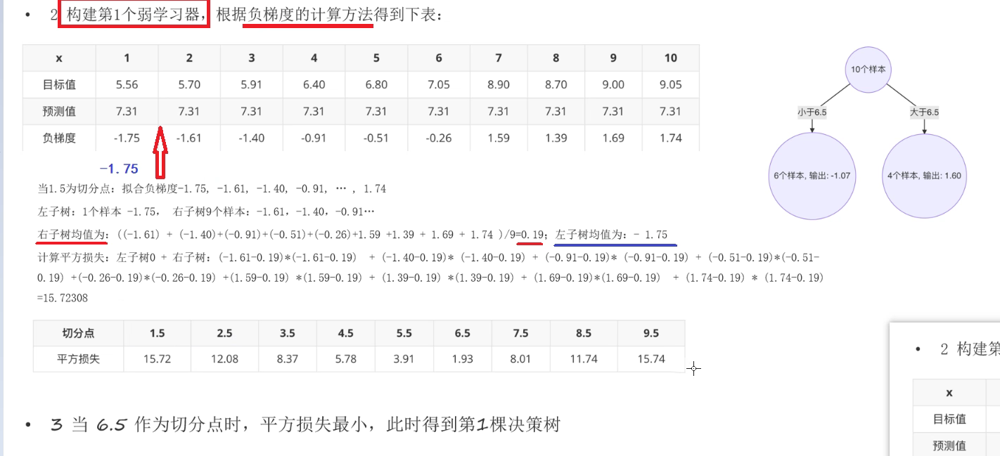

# GBDT 回归算法：构建第一个弱学习器（最佳切分点选择）

在计算出初始预测值（所有样本的平均值 $7.31$）后，我们需要通过**计算负梯度（残差）**来构建第一棵真正有分叉的弱学习器（CART 回归树）。

---

## 一、 算法核心步骤与逻辑

### 1. 确定候选切分点（“分割 9 次”）
由于样本已经按照特征 $x$ 从小到大排好序（共 10 个样本），在相邻两个样本之间切一刀，总共有 $10 - 1 = 9$ 个候选切分位置。
* 候选切分点分别为：`1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5`。

### 2. 计算子树的负梯度均值（预测值）
对于每一个候选切分点，数据都会被分为**左子树**和**右子树**两部分。我们需要分别计算左右两侧所有样本负梯度的**算术平均值**，作为该子树的输出值。
* *示例（以 1.5 为切分点）：*
  * **左子树**（包含样本 1）：$\text{左均值} = -1.75$
  * **右子树**（包含样本 2~10）：$\text{右均值} = \frac{-1.61 + (-1.40) + \dots + 1.74}{9} = 0.19$

### 3. 计算平方损失（寻优指标）
利用**“损失平方最小化”**原则，计算当前切分下左右子树的总误差。公式为：
$$\text{Total MSE} = \sum_{i \in \text{左子树}} (r_i - \text{左均值})^2 + \sum_{j \in \text{右子树}} (r_j - \text{右均值})^2$$
*(其中 $r$ 代表样本的负梯度值)*

* *示例（以 1.5 为切分点）：*
  $$\text{Total MSE} = \underbrace{(-1.75 - (-1.75))^2}_{\text{左子树平方损失}} + \underbrace{(-1.61 - 0.19)^2 + (-1.40 - 0.19)^2 + \dots + (1.74 - 0.19)^2}_{\text{右子树平方损失}} = 15.72308$$

### 4. 选取最优切分点
将 9 个候选切分点各自对应的平方损失进行横向对比，**挑选出能让总平方损失最小的那个点**作为最终的物理分割依据。

---

## 二、 切分点评级与最终决策树结构

通过遍历计算，得到不同切分点的平方损失映射表：

| 切分点 | 1.5 | 2.5 | 3.5 | 4.5 | 5.5 | **6.5** | 7.5 | 8.5 | 9.5 |
| :--- | :---: | :---: | :---: | :---: | :---: | :---: | :---: | :---: | :---: |
| **平方损失** | 15.72 | 12.08 | 8.37 | 5.78 | 3.91 | **1.93** | 8.01 | 11.74 | 15.74 |

### 最终结论
从表中可以看出，当以 **`6.5`** 作为切分点时，平方损失达到全局最小值 **`1.93`**。

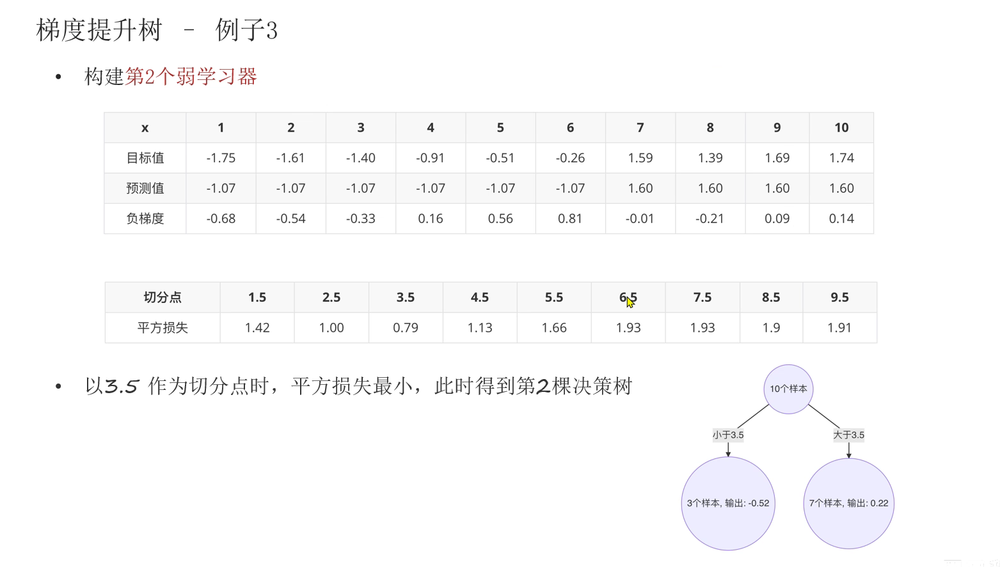

* 将上一个的负梯度值 设为下一个决策树的目标值 重复这个过程

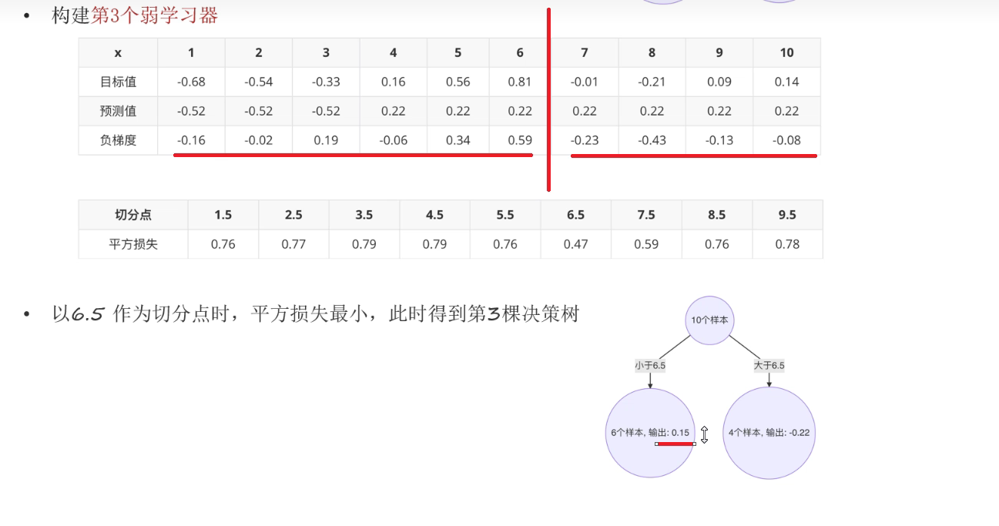

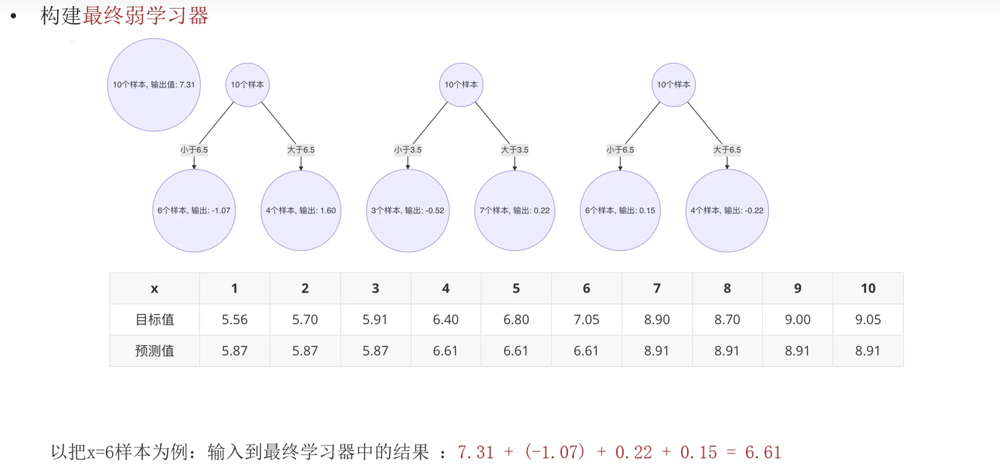

# GBDT 回归算法：理解初始全局值（7.31）与后续决策树的关系

在观察最终集成模型（如截图中所示）时，会发现预测公式的最前端拥有一个独立于决策树之外的常数 $7.31$，随后才累加各棵树的输出值。

---

## 一、 为什么不能直接从三个决策树开始？

GBDT（梯度提升决策树）是一个**加法模型**，它的核心逻辑是：**“全局基准 + 逐棵树串联纠错”**。

1. **初始值 $7.31$ 是模型的“大盘底色”**：
   在没有任何树参与时，模型为了让全局初始损失最小，直接取了所有样本目标值的平均值（即 $7.31$）作为初始预测值。它不是一棵树，而是一个**全局常数项 $f_0(x)$**。
2. **后续的决策树不是为了直接预测目标值，而是为了“拟合残差（纠错）”**：
   * 有了 $7.31$ 作为基准线后，每个样本才产生了“残差”（$\text{真实值} - 7.31$）。
   * 后面的第一棵树、第二棵树、第三棵树，它们的任务**不是**去预测样本最终的目标值，而是去预测前一步留下的**残差**（修正量）。
   * 也就是说，树的叶子节点输出值（如 $-1.07$、 $0.22$）只是**微调方向和幅度**，它们必须基建在 $7.31$ 这个大盘基础上。

---

## 二、 最终学习器的组合与串联计算

以截图中 **样本 $x=6$**（目标值为 $7.05$）为例，其通往最终模型的全流程预测计算如下：

$$f(x) = f_0(x) + \sum_{m=1}^{M} T_m(x)$$

代入图中具体数据：
$$\text{最终预测值} = \underbrace{7.31}_{\text{初始全局值 } f_0(x)} + \underbrace{(-1.07)}_{\text{第一棵树输出}} + \underbrace{0.22}_{\text{第二棵树输出}} + \underbrace{0.15}_{\text{第三棵树输出}} = \mathbf{6.61}$$

### 各部分物理意义拆解：
* **$7.31$（全局盲猜）**：模型不知道特征时，盲猜大盘平均分。
* **$-1.07$（一棵树修正）**：第一棵树发现 $x=6$ 小于切分点 $6.5$，大盘猜高了，于是叶子节点输出负向修正量 $-1.07$。
* **$+0.22$（二棵树修正）**：第二棵树对第一棵树纠错后的残差再次进行局部微调，输出 $+0.22$。
* **$+0.15$（三棵树修正）**：第三棵树进行最后一轮残差精细化修正，输出 $+0.15$。

最后，所有修正量叠加在初始值上，得到了逼近真实值 $7.05$ 的最终预测结果 **$6.61$**。

---

## 三、 核心结论
* **$7.31$ 是起点**：没有这个初始常数，后面的树就失去了计算“残差靶子”的基础。
* **树是修正器**：后面的多棵决策树在结构上是并列相加的，但在业务逻辑上是**逐层递进纠错**的。它们输出的是“残差步长”，而非独立绝对值。

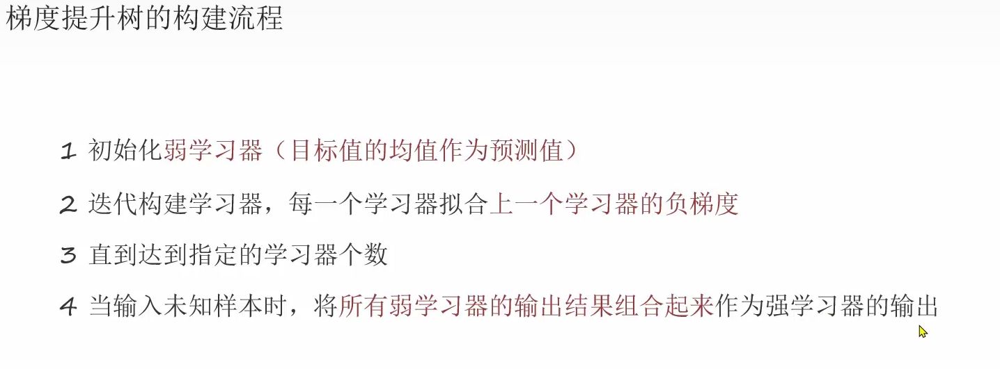

# GBDT例子

In [4]:
"""
案例:
    演示 Boosting思想之  GBDT(Gradient Boosting Decision Tree, 梯度提升树) 处理 泰坦尼克号数据集.

GBDT 梯度提升树解释:
    概述:
        通过拟合 负梯度 来获取一个强学习器
    流程:
        1. 采用所有目标值的均值 作为第1个弱学习器的 预测值.
        2. 目标值 - 预测值 = 负梯度(残差), 该(列)值作为 第2个弱学习器的 目标值.
        3. 针对于第1个弱学习器, 依次计算每个分割点的 最小平方和, 找到最佳 分割点, 至此: 第1个弱学习器搭建完毕.
        4. 把上述的分割点带入第2个弱学习器, 计算它的预测值 = 以此分割点为界, 目标值的均值, 即为该部分数据的 预测值.
        5. 计算第2个弱学习器的 负梯度, 最佳分割点, 至此: 第2个弱学习器搭建完毕.
        6. 以此类推, 直至程序结束.
"""

# 导入库
import pandas as pd
from sklearn.model_selection import train_test_split        # 切割训练集 和 测试集
from sklearn.tree import DecisionTreeClassifier             # 决策树分类器
from sklearn.ensemble import GradientBoostingClassifier     # 梯度提升树分类器
from sklearn.metrics import classification_report, accuracy_score  # 模型评估
from sklearn.model_selection import GridSearchCV            # 网格搜索


# 1. 读取数据.
df = pd.read_csv('./data/train.csv')
# df.info()

# 2. 数据的预处理.
# 2.1 提取 特征 和 标签.
x = df[['Pclass', 'Sex', 'Age']].copy()
y = df['Survived'].copy()

# 2.2 处理Age列的缺失值, 用该列的均值填充.
# x['Age'].fillna(x['Age'].mean(), inplace=True)
x['Age'] = x['Age'].fillna(x['Age'].mean())

# 2.3 热编码处理字符串类型.
x = pd.get_dummies(x)

# 2.4 切割训练集 和 测试集.
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=23)

# 3. 特征工程, 这里略.

# 4. 模型训练, 预测, 评估.
# 场景1: 单个决策树对象(CART).
# 4.1 创建模型对象.
estimator = DecisionTreeClassifier()
# 4.2 模型训练.
estimator.fit(x_train, y_train)
# 4.3 模型预测.
y_predict = estimator.predict(x_test)
print(f'单个决策树对象的预测结果: {y_predict}')
# 4.4 模型评估.
# print(f'单个决策树对象的分类评估报告: \n{classification_report(y_test, y_predict)}')
print(f'单个决策树对象的准确率: {accuracy_score(y_test, y_predict)}')      # 0.8044692737430168
print('-' * 23)

# 场景2: 梯度提升树对象(GBDT).
# 4.1 创建模型对象.
estimator2 = GradientBoostingClassifier()        # 默认值
# 4.2 模型训练.
estimator2.fit(x_train, y_train)
# 4.3 模型预测.
y_predict = estimator2.predict(x_test)
print(f'梯度提升树对象的预测结果: {y_predict}')
# 4.4 模型评估.
print(f'梯度提升树对象的准确率: {accuracy_score(y_test, y_predict)}')      # 0.8100558659217877


# 场景3: 针对于GBDT(梯度提升树)模型, 进行参数调优.
# 4.1 定义模型可选参数
param_dict = {
    'n_estimators': [55, 60, 65, 70],      # 在 60 附近精细微调
    'learning_rate': [0.4, 0.5, 0.55],     # 在 0.5 附近精细微调
    'max_depth': [3, 4, 5]                 # 树不用太深，防止过拟合
}
# 4.2 创建 梯度提升树 模型对象.
estimator3 = GradientBoostingClassifier()
# estimator3.fit(x_train, y_train)

# 4.3 创建网格搜索对象.
estimator4 = GridSearchCV(estimator3, param_dict, cv=3)
# 4.4 模型训练.
estimator4.fit(x_train, y_train)
# 4.5 模型评估
print(f'网格搜索后的模型准确率: {estimator4.best_score_}')
print(f'网格搜索后的模型: {estimator4.best_estimator_}')

单个决策树对象的预测结果: [1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 1 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0
 0 0 1 0 1 1 0 1 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0
 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 1 0 0 0
 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 1 1]
单个决策树对象的准确率: 0.8044692737430168
-----------------------
梯度提升树对象的预测结果: [1 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 1 1 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 1 1 0 1 0 0 0 1
 0 0 1 0 1 1 0 1 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 0
 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 1 0 0 0
 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 1 1]
梯度提升树对象的准确率: 0.8100558659217877
网格搜索后的模型准确率: 0.7837168622723351
网格搜索后的模型: GradientBoostingClassifier(learning_rate=0.55, max_depth=5, n_estimators=65)


# XGBoost

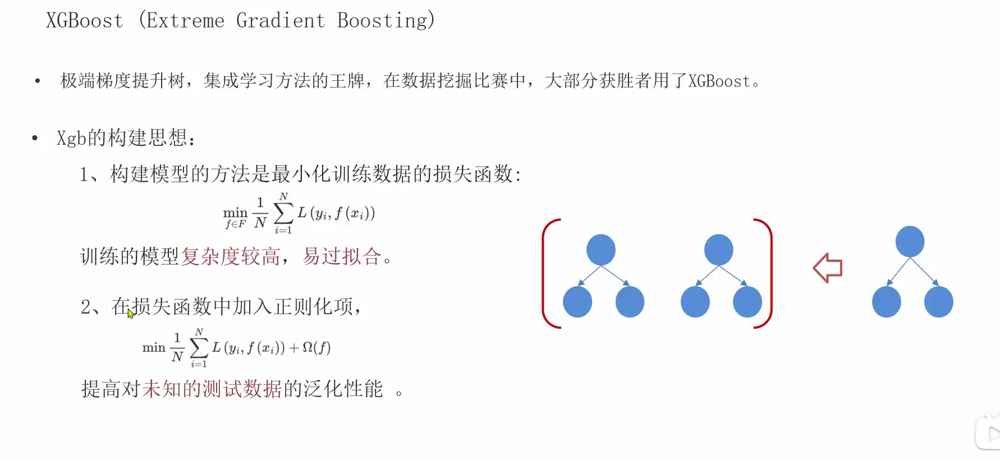

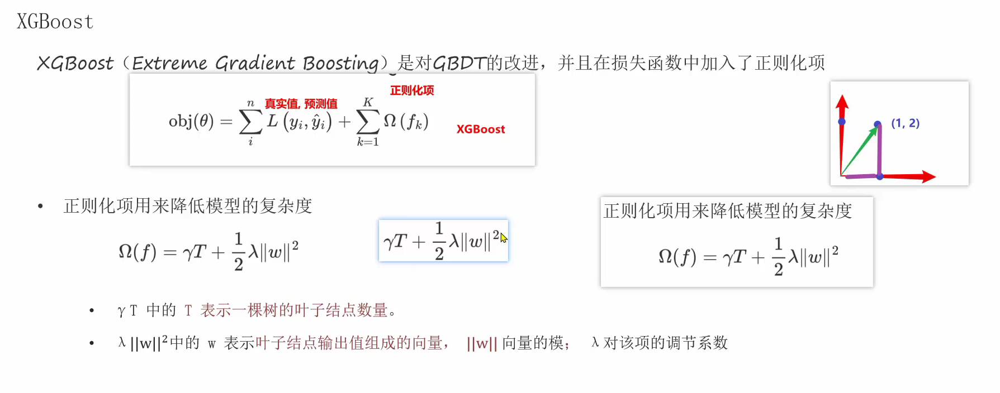

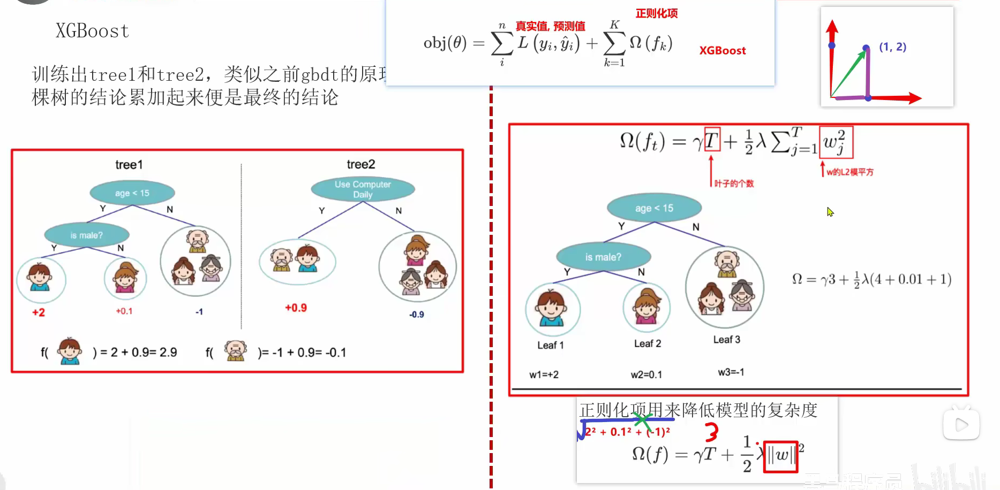
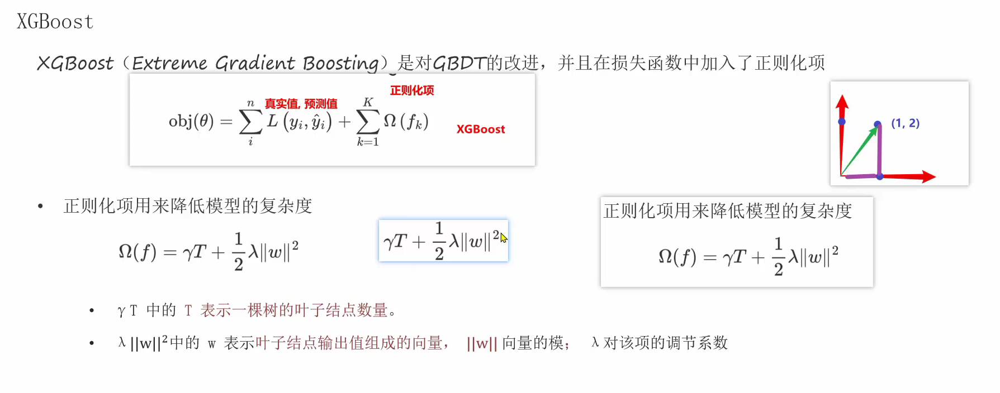

* ||w||就是输出值的平方相加再开根号 由于公式中多了个平方 所以就把根号消掉了
* 此向量是一个3维的单个向量[2,0.1,-1]

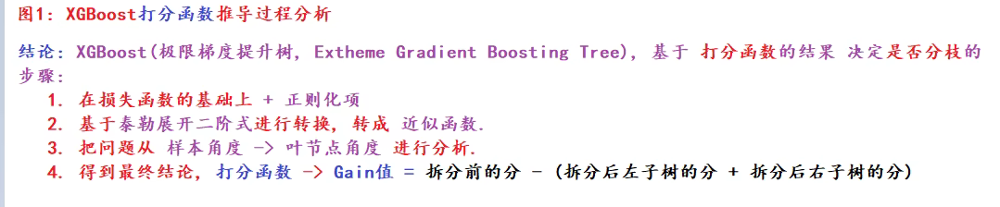

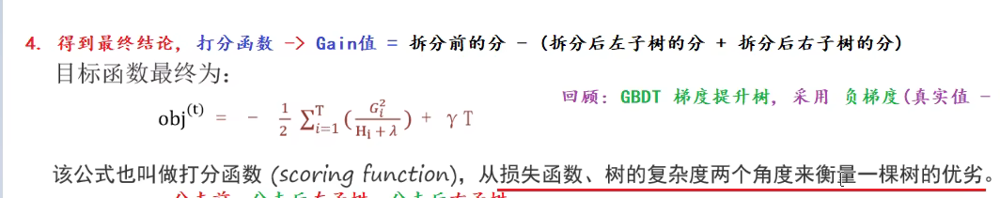
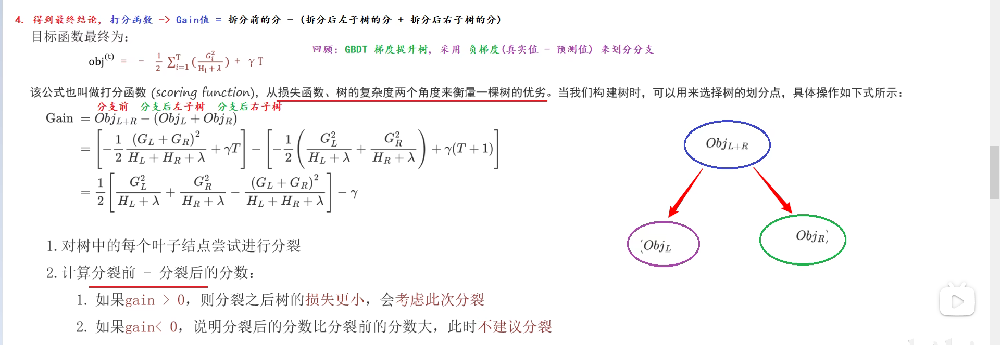

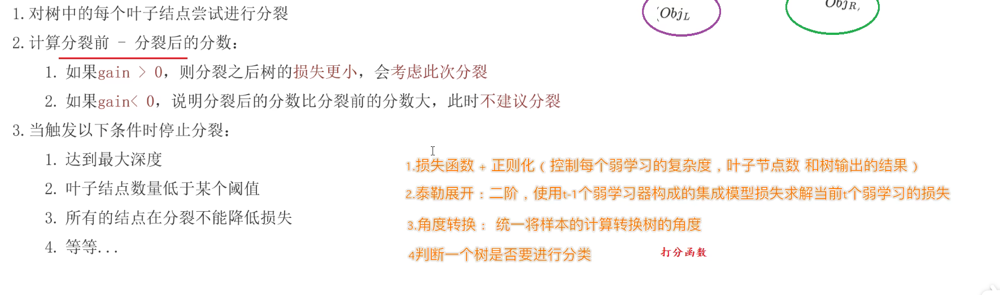

## XGBoost案例

In [ ]:
"""
案例:
    通过 XGBoost 极限梯度提升树 完成 红酒品质分类案例.


回顾: XGBoost 极限梯度提升树
    概述:
        Extreme Gradient Boosting Tree, 底层采用 打分函数 决定是否分支.
    原理:
        Gain值 = 分枝前的打分 - (分支后左子树打分 + 分支后右子树打分)
        如果 Gain值 > 0, 考虑分枝, 否则: 不考虑分枝.
"""

import joblib                                           # 保存和加载模型
import numpy as np
import pandas as pd
import xgboost as xgb                                   # 极限梯度提升树对象
from collections import Counter                         # 统计数据
from sklearn.model_selection import train_test_split, GridSearchCV  # 训练集和测试集的划分
from sklearn.metrics import classification_report, accuracy_score  # 模型(分类)评估报告
from sklearn.model_selection import StratifiedKFold     # 分层K折交叉验证, 类似于 网格搜索时 cv=折数
from sklearn.utils import class_weight                  # 计算样本权重


# 1. 定义函数, 对 红酒品质分类源数据 -> 拆分成 训练集和测试集, 并存储到csv文件中.
def dm01_data_split():
    # 1. 加载数据集.
    df = pd.read_csv('./data/红酒品质分类.csv')
    # 2. 查看数据集.
    # df.info()

    # 3. 抽取特征数据 和 标签数据.
    x = df.iloc[:, :-1]
    y = df.iloc[:, -1] - 3      # 最后1列是标签, 默认范围是: [3, 8]  -> [0, 5]

    # 4. 查看数据.
    # print(x[:5])
    # print(y[:5])
    # print(f'查看 标签结果的分布情况, 是否均衡: {Counter(y)}')

    # 5. 切分 训练集和测试集.
    # 参1: 特征数据. 参2: 标签数据. 参3: 测试集的比例. 参4: 随机种子. 参5: 参考数据集的标签分布.
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=23, stratify=y)

    # 6. 把上述的 训练集特征 和 标签数据拼接到一起,  测试集特征 和 标签数据拼接到一起.  最后写到文件中.
    # print(pd.concat([x_train, y_train], axis=1))
    pd.concat([x_train, y_train], axis=1).to_csv('./data/红酒品质分类_train.csv', index=False)  # 忽略索引
    pd.concat([x_test, y_test], axis=1).to_csv('./data/红酒品质分类_test.csv', index=False)  # 忽略索引

# 2. 定义函数, 训练模型, 并保存模型.
def dm02_train_model():
    # 1. 读取训练集和测试集.
    train_data = pd.read_csv('./data/红酒品质分类_train.csv')
    test_data = pd.read_csv('./data/红酒品质分类_test.csv')

    # 2. 提取 训练集和测试集的 特征数据 和 标签数据.
    x_train = train_data.iloc[:, :-1]   # 除了最后1列, 都是特征
    y_train = train_data.iloc[:, -1]    # 最后1列是标签

    x_test = test_data.iloc[:, :-1]
    y_test = test_data.iloc[:, -1]

    # 3. 创建模型对象.
    estimator = xgb.XGBClassifier(
        max_depth=5,                # 树的最大深度
        n_estimators=100,           # 树的数量
        learning_rate=0.1,          # 学习率
        random_state=23,            # 随机种子
        objective='multi:softmax'   # 多分类问题, 使用多分类模型.
    )

    # 加入 平衡权重, 因为数据集是 样本不均衡的.
    # 参1: 平衡权重, 参2: 标签数据(即: 参考标签数据分布, 平衡权重)
    class_weight.compute_sample_weight('balanced', y_train)

    # 4. 模型训练.
    estimator.fit(x_train, y_train)

    # 5. 模型评估.
     print(f'准确率: {estimator.score(x_test, y_test)}')

    # 6. 保存模型.
    joblib.dump(estimator, './model/红酒品质分类.pkl')    # 后缀名也可以写 .pth, 都是pickle文件格式
    print('模型保存成功!')


# 3. 定义函数, 测试模型.
def dm03_use_model():
    # 1. 读取训练集和测试集.
    train_data = pd.read_csv('./data/红酒品质分类_train.csv')
    test_data = pd.read_csv('./data/红酒品质分类_test.csv')

    # 2. 提取 训练集和测试集的 特征数据 和 标签数据.
    x_train = train_data.iloc[:, :-1]  # 除了最后1列, 都是特征
    y_train = train_data.iloc[:, -1]  # 最后1列是标签

    x_test = test_data.iloc[:, :-1]
    y_test = test_data.iloc[:, -1]

    # 3. 加载模型.
    estimator = joblib.load('./model/红酒品质分类.pkl')

    # 4. 创建网格搜索 + 交叉验证(结合分层采样数据), 找模型最优参数组合.
    # 4.1 定义变量, 记录: 参数组合.
    param_dict = {'max_depth': [2, 3, 5, 6, 7], 'n_estimators': [30, 50, 100, 150], 'learning_rate': [0.2, 0.3, 1, 1.3]}
    # 4.2 创建 分层采样 对象.
    # 参1: 折数, 参2: 是否打乱(数据), 参3: 随机种子.
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=23)
    # 4.3 创建 网格搜索 + 交叉验证(结合分层采样数据) 对象.
    # 参1: 模型对象, 参2: 参数组合, 参3: 交叉验证对象.
    gs_estimator = GridSearchCV(estimator, param_dict, cv=skf)

    # 5. 模型训练.
    gs_estimator.fit(x_train, y_train)

    # 6. 模型预测.
    y_pre = gs_estimator.predict(x_test)
    print(f'预测值为: {y_pre}')

    # 7. 打印模型评估系数.
    print(f'最优估计器对象组合: {gs_estimator.best_estimator_}')
    print(f'最优评分: {gs_estimator.best_score_}')
    print(f'准确率: {accuracy_score(y_test, y_pre)}')

# 4. 测试
if __name__ == '__main__':
    # dm01_data_split()
    # dm02_train_model()
    dm03_use_model()

# 贝叶斯算法

## 📊 机器学习笔记：贝叶斯定理 vs 朴素贝叶斯算法

在分类任务中，我们经常需要计算**“在某些特征出现的前提下，目标发生的概率”**。本笔记结合“女神是否喜欢某种特征的男生”这一经典案例，深入剖析**贝叶斯定理（精确计算）**与**朴素贝叶斯（近似预测）**的本质区别。

---

### 1. 原始数据集（样本空间）

假设我们拥有以下 7 条训练数据：

| 编号 | 职业  | 体型 | 女神是否喜欢 ($C$) |
| :---: |:---:| :---: | :---: |
| 1 | 程序员 | 超重 | 不喜欢 |
| 2 | 产品  | 匀称 | 喜欢 |
| 3 | 程序员 | 匀称 | 喜欢 |
| 4 | 程序员 | 超重 | 喜欢 |
| 5 | 美工  | 匀称 | 不喜欢 |
| 6 | 美工  | 超重 | 不喜欢 |
| 7 | 产品  | 匀称 | 喜欢 |

* **核心问题**：如果来了一个新男生，他的特征是 **（职业=程序员，体型=超重）**，女神喜欢他的概率是多少？
* **数学表达**：求后验概率 $P(\text{喜欢} \mid \text{程序员, 超重})$

---

### 2. 👑 贝叶斯定理（Bayes' Theorem）—— 尊重现实，精准无误

#### 💡 底层大白话
**“上帝视角，精准数数”**。直接死磕原始表格，把所有符合“超重程序员”的倒霉蛋抓出来，看看里面有几个人被喜欢。

#### 🔢 数数法推导过程
1. **限定人群（分母）**：在整个表格中，同时满足 `职业=程序员` 且 `体型=超重` 的人总共有 **2** 个（编号 1 和 编号 4）。
2. **寻找目标（分子）**：在这 2 个超重程序员中，女神 `喜欢` 的人有 **1** 个（编号 4）。
3. **最终概率**：
   $$P(\text{喜欢} \mid \text{程序员, 超重}) = \frac{1}{2} = 0.5 \quad (50\%)$$

#### 📝 贝叶斯公式标准计算流程
如果不直接数数，严格套用贝叶斯公式 $P(C \mid W) = \frac{P(W \mid C)P(C)}{P(W)}$ 展开：

1. **计算先验概率 $P(C)$**：全班 7 个人，女神喜欢的有 4 个 $\rightarrow P(\text{喜欢}) = \frac{4}{7}$
2. **计算联合条件概率 $P(W \mid C)$**：在喜欢的 4 个人里，又是程序员又超重的有 1 个（编号4） $\rightarrow P(\text{程序员, 超重} \mid \text{喜欢}) = \frac{1}{4}$
3. **计算分子（此时的后验概率中间值）**：
   $$P(\text{程序员, 超重} \mid \text{喜欢}) \times P(\text{喜欢}) = \frac{1}{4} \times \frac{4}{7} = \frac{1}{7}$$
4. **计算分母（全社会超重程序员的概率 $P(W)$）**：7个人里有2个超重程序员 $\rightarrow P(\text{程序员, 超重}) = \frac{2}{7}$
5. **最终结果（除法约分）**：
   $$P(\text{喜欢} \mid \text{程序员, 超重}) = \frac{1}{7} \div \frac{2}{7} = \mathbf{0.5}$$

* **评价**：结果极其精准。但在大工业工程中，如果特征有 100 个，想要在数据库里找到同时满足这 100 个特征的样本，分母极大概率为 0（数据孤岛），导致**公式直接瘫痪**。

---

### 3. 🤖 朴素贝叶斯算法（Naive Bayes）—— 天真假设，强行脑补

#### 💡 底层大白话
**“装傻充愣，拆开相乘”**。为了防止特征太多在现实中数不出人数，算法加了“**朴素**（Naive，天真）”两个字，强行假设：**职业和体型是两个完全独立的平行宇宙，互不干扰。**

#### ⚠️ 算法的“脑补”翻车点
在计算核心步骤 $P(\text{程序员, 超重} \mid \text{喜欢})$ 时，朴素贝叶斯不承认现实中程序员更容易发胖的绑定关系，硬生生将其拆开：
$$P(\text{程序员, 超重} \mid \text{喜欢}) \approx P(\text{程序员} \mid \text{喜欢}) \times P(\text{超重} \mid \text{喜欢})$$

我们去女神喜欢的 4 个人（编号 2, 3, 4, 7）里分别数数：
* 喜欢的 4 人里，有 2 个程序员 $\rightarrow P(\text{程序员} \mid \text{喜欢}) = \frac{2}{4} = \frac{1}{2}$
* 喜欢的 4 人里，有 1 个超重（编号4） $\rightarrow P(\text{超重} \mid \text{喜欢}) = \frac{1}{4}$

**算法脑补出的核心概率**：
$$\frac{1}{2} \times \frac{1}{4} = \mathbf{\frac{1}{8}} \quad (\text{真实世界里明明是 } \frac{1}{4})$$

#### 📉 朴素贝叶斯最终算出的结局
如果当年硬套这个朴素假设，顺着公式往下算：
1. **分子（脑补版）**：$\frac{1}{8} \times P(\text{喜欢}) = \frac{1}{8} \times \frac{4}{7} = \frac{1}{14}$
2. **分母（同样被拆开脑补的 $P(W)$）**：$P(\text{程序员}) \times P(\text{超重}) = \frac{3}{7} \times \frac{3}{7} = \frac{9}{49}$
3. **最终预测概率**：
   $$P(\text{喜欢} \mid \text{程序员, 超重}) \approx \frac{1}{14} \div \frac{9}{49} = \frac{7}{18} \approx \mathbf{0.388} \quad (38.8\%)$$

* **评价**：算法把原本现实中 **50%** 的概率，硬生生低估成了 **38.8%**。这就是它为“天真假设”付出的**精度代价**。

---

### ⚖️ 核心总结：两者的终极对决

| 维度 | 👑 贝叶斯定理 (Bayes) | 🤖 朴素贝叶斯 (Naive Bayes) |
| :--- | :--- | :--- |
| **核心中间值** | $P(\text{程序员, 超重} \mid \text{喜欢}) = \mathbf{\frac{1}{4}}$ | $P(\text{程序员} \mid \text{喜欢}) \times P(\text{超重} \mid \text{喜欢}) = \mathbf{\frac{1}{8}}$ |
| **最终喜欢概率** | $\mathbf{0.5}$ (精准体现现实) | $\mathbf{0.388}$ (因为特征独立假设产生偏差) |
| **对待特征关系** | 紧密拥抱现实，考虑特征间的关联 | 强行割裂，认为特征之间绝对独立 |
| **工业落地能力** | 特征一多容易因为“数不出人”而**瘫痪** | 管你几千个特征，通通拆开死算，**永不瘫痪且速度极快** |

> **🌟 结语**：
> 老师在第一阶段 PPT 里推导出的 **0.5** 是经典的**贝叶斯定理**；而机器学习后面要用的**朴素贝叶斯算法**，则是为了工程落地主动选择“装傻”，用 $\frac{1}{8}$ 的数学手段向计算效率做出的伟大妥协。

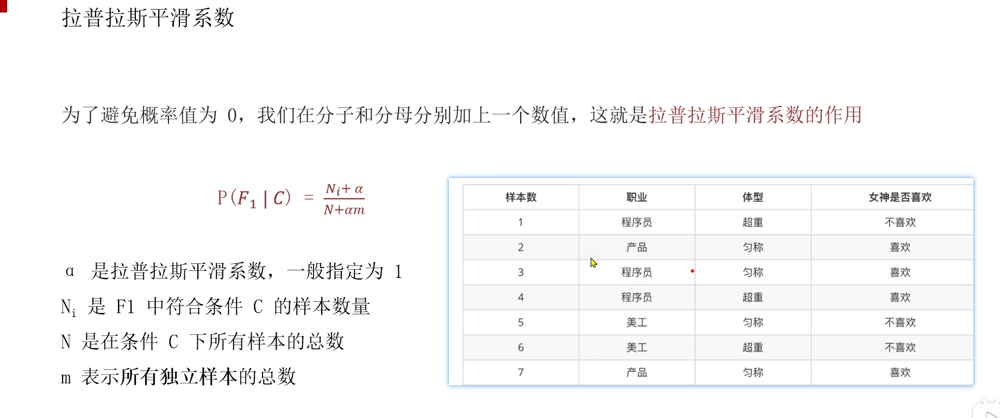

## 🛡️ 机器学习笔记：拉普拉斯平滑系数（Laplace Smoothing）

在利用朴素贝叶斯算法处理分类任务时，**拉普拉斯平滑系数**是一个至关重要的“防爆机制”。它专门用来解决因样本量不足而导致的 **“零概率陷阱”** 问题。

---

### 1. 🚨 为什么需要拉普拉斯平滑？（零概率瘫痪）

机器学习模型完全依赖训练集来建立认知。如果遇到**训练集中从未出现过的新组合**，不加平滑就会引发灾难性的“一票否决”。

#### 💥 翻车案例
假设今天来了一个新男生，他的特征是 **（职业=保安，体型=超重）**。我们想用朴素贝叶斯预测女神是否会喜欢他。

在计算过程中，算法需要去数数并计算：
$$P(\text{职业=保安} \mid \text{喜欢})$$

回到我们的 7 条历史数据中，发现女神喜欢的 4 个人里（编号2, 3, 4, 7），职业分别是产品、程序员和美工，**根本没有一个是保安**！
* 于是，这一项的条件概率直接变成了：
  $$P(\text{职业=保安} \mid \text{喜欢}) = \frac{0}{4} = 0$$

#### 💀 致命后果
由于朴素贝叶斯的底层逻辑是将各个特征的条件概率**连续相乘**。只要其中任何一项为 $0$，哪怕这个保安长得再帅、体型再完美，最终的乘积都会被无情地抹杀为 $0$：
$$\text{最终喜欢概率} = P(\text{保安} \mid \text{喜欢}) \times P(\text{超重} \mid \text{喜欢}) \times P(\text{喜欢}) = 0 \times \frac{1}{4} \times \frac{4}{7} = 0$$

> **大白话**：算法因为以前没见过被喜欢的保安，就一口咬定女神绝对不可能喜欢世界上任何一个保安。这种由于数据局限导致的“一票否决”显然极不合理。

---

### 2. 🛠️ 核心解决方案：拆解平滑公式

拉普拉斯平滑的骚操作是：**在分子和分母上，强行人为地加上一个微小的修正值，确保概率永远大于 $0$。**

#### 📐 标准数学公式
$$P(F_1 \mid C) = \frac{N_i + \alpha}{N + \alpha m}$$

#### 🔍 参数大白话翻译：
* $F_1$：当前要计算的特征（例如：`职业=保安`）
* $C$：当前的目标类别（例如：`女神喜欢`）
* $N_i$（原本的分子）：在类别 $C$ 下，特征 $F_1$ 出现的真实次数。**（这里保安真实次数为 0）**
* $\alpha$（平滑系数）：**通常指定为 $1$**。分子加了 1，强制打破 $0$ 的僵局！
* $N$（原本的分母）：类别 $C$ 下的总样本数。**（女神喜欢总人数为 4）**
* $m$（特征的种类数 / 坑位数）：当前这个特征一共包含多少种可能的值。**（“职业”特征在表格中共有 `[程序员, 产品, 美工]` 3 种）**

#### 🔢 强制“充水”后的计算过程
套入拉普拉斯平滑公式，女神喜欢保安的概率成功被拯救：
$$P(\text{保安} \mid \text{喜欢}) = \frac{0 + 1}{4 + 1 \times 3} = \frac{1}{7}$$

条件概率从绝望的 $0$，变成了一个微小但合理的概率 $\frac{1}{7}$，模型得以继续健康运转！

---

### 3. 🤔 为什么分母要加 $\alpha \times m$ ？

这是初学者最容易懵圈的地方。**一句话解释：为了保证数学上的公平性，确保所有可能性的概率相加依然等于 $1$（100%）。**

在数学里，你给分子加了钱，分母也必须跟着等比例加钱。如果不乘以 $m$（特征种类数），总概率加起来就会超过 1。

我们来看看加了平滑（$\alpha=1$）后，在“喜欢”的圈子里，所有职业的概率分布变化：
* **程序员**（原本 2 人）：从 $\frac{2}{4}$ 变为 $\rightarrow \frac{2 + 1}{4 + 3} = \frac{3}{7}$
* **产品**（原本 2 人）：从 $\frac{2}{4}$ 变为 $\rightarrow \frac{2 + 1}{4 + 3} = \frac{3}{7}$
* **美工/保安等其他未出现职业**（原本 0 人）：从 $\frac{0}{4}$ 变为 $\rightarrow \frac{0 + 1}{4 + 3} = \frac{1}{7}$

##### 📊 检验归一化：
我们将所有职业概率求和：
$$\Sigma P = \frac{3}{7} + \frac{3}{7} + \frac{1}{7} = \frac{7}{7} = 1 \quad (100\%)$$

分母加上 $\alpha \times m$，极其优雅地保证了概率空间没有崩塌。

---

### 💡 核心总结

* **本质**：拉普拉斯平滑是统计学和机器学习里的**“做人留一线”**。
* **手段**：通过给分子分母“人工充水”（通常取 $\alpha=1$），**把从未出现过的绝对 $0$ 概率，转化为一个极小的微小概率**。
* **代价**：它会稍微稀释原本高频特征的概率（例如把原本 50% 的程序员概率稀释到了 42.8%），但换来了模型面对未知数据时的**超强鲁棒性（防瘫痪能力）**。

## 朴素贝叶斯API

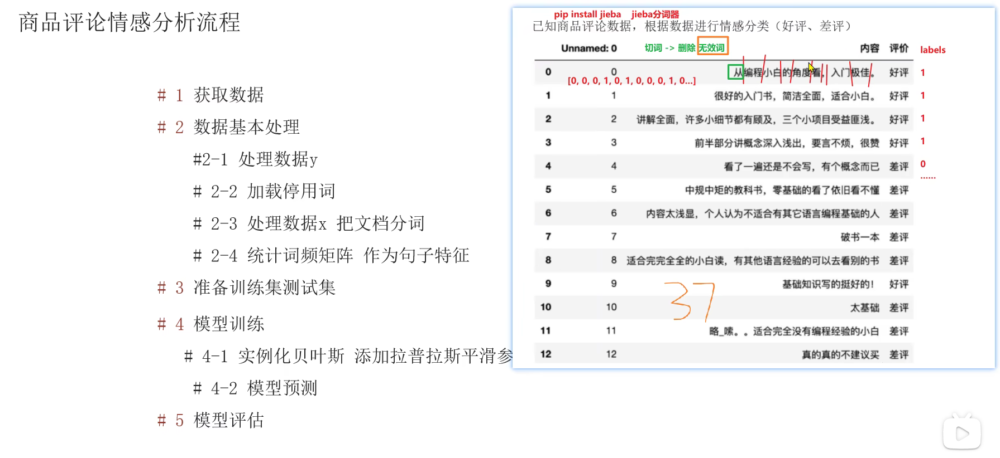

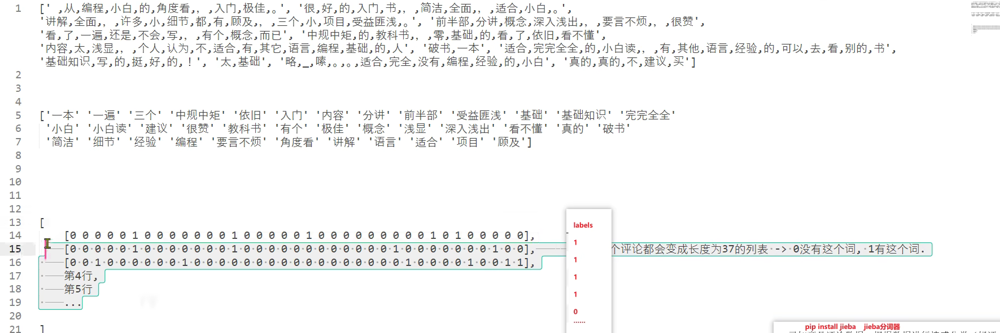

In [ ]:
"""
案例:
    演示通过 朴素贝叶斯算法 实现  商品评论情感分析, 即: 好评, 差评...

朴素贝叶斯介绍:
    概述:
        贝叶斯: 仅仅依赖 概率 就可以进行分类的 一种机器学习算法.
        朴素:   不考虑特征之间的关联性, 即: 特征间都是相互独立的.
            原始:  P(AB) = P(A) * P(B|A) = P(B) * P(A|B)
            加入朴素后: P(AB) = P(A) * P(B)
    细节:
        因为我们分词要用到 jieba分词器, 记得先装一下, 例如: pip install jieba
"""

# 导包
import numpy as np                  # 数学计算包
import pandas as pd                 # 数据处理包
import matplotlib.pyplot as plt     # 画图包
import jieba                        # 分词包
from sklearn.feature_extraction.text import CountVectorizer # 词频统计包, 把评论内容 转成 词频矩阵.
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import MultinomialNB               # 朴素贝叶斯对象

# 1. 读取文件, 获取到原始数据.
df = pd.read_csv('./data/书籍评价.csv', encoding='gbk')
# df.info()

# 2. 数据预处理.
# 2.1 添加labels列, 充当: 标签列.  好评 -> 1, 差评 -> 0
df['labels'] = np.where(df['评价'] == '好评', 1, 0)
# df.info()
# print(df)

# 2.2 抽取 labels列, 作为: 标签.
y = df['labels']

# 2.3 演示 jieba 分词
# print(jieba.lcut('好好学习, 天天向上! 我爱你你爱我, 蜜雪冰城甜蜜蜜! 小明骑车, 一把把把把住了.'))

# 2.4 对用户的评论信息, 做切词.
# 数据格式: [[第1条评论切词1, 切词2, 切词3...], [第2条评论切词1, 切词2, 切词3...], ...]
comment_list = [','.join(jieba.lcut(line)) for line in df['内容']]
# 数据格式: ['第1条评论切词1, 切词2, 切词3...', '第2条评论切词1, 切词2, 切词3...', ...]
print(comment_list)

# 演示字符串的 join()函数用法.
# my_list = ['aa', 'bb', 'cc']
# print(','.join(my_list))

# 2.5 加载 停用词列表, 即: 里边记录的词, 不需要参与模型训练, 预测, 要被删除的词, 例如: 的, 啊, 哈, 从, 都...
with open('./data/stopwords.txt', 'r', encoding='utf-8') as src_f:
    # 2.5.1 一次读取所有的行
    stopwords_list = src_f.readlines()
    # 2.5.2 删除最后的 '\n'
    stopwords_list = [line.strip() for line in stopwords_list]
    # 2.5.3 对 停用词列表去重.
    stopwords_list = list(set(stopwords_list))
    print(stopwords_list)

# 2.6 创建向量化对象, 从 评论切词列表(comment_list) 中 删除 停用词, 并且统计词频(单词矩阵).
transfer = CountVectorizer(stop_words=stopwords_list)   # 参数: 停用词列表.
# 2.7 统计词频矩阵, 先训练, 后转换, 在转数组.
# transfer.fit(comment_list)
# x的格式: [[第1条评论的切词分布, 有就是1, 没有就是0], [第2条评论的切词分布, 有就是1, 没有就是0], ...]
# x = transfer.transform(comment_list).toarray()
x = transfer.fit_transform(comment_list).toarray()
print(x)

# 2.8 看一下 我们13条评论, 切词, 且删除 停用词后, 一共剩下多少个词了.
print(transfer.get_feature_names_out())
print(len(transfer.get_feature_names_out()))    # 37个词, 即: 13条评论, 切词, 且删除 停用词后, 一共剩下多少个词了.

# 2.9 因为就 13条数据, 我们把前10条当训练集, 后三条当测试集.
x_train = x[:10]
y_train = y[:10]

x_test = x[10:]
y_test = y[10:]

# 3. 特征工程, 此处略.

# 4. 模型训练.
estimator = MultinomialNB()     # 创建 朴素贝叶斯模型对象.
estimator.fit(x_train, y_train)
# 5. 模型预测.
y_pred = estimator.predict(x_test)
print(f'模型预测结果: {y_pred}')

# 6. 模型评估.
print(f'准确率: {accuracy_score(y_test, y_pred)}')

# 聚类算法

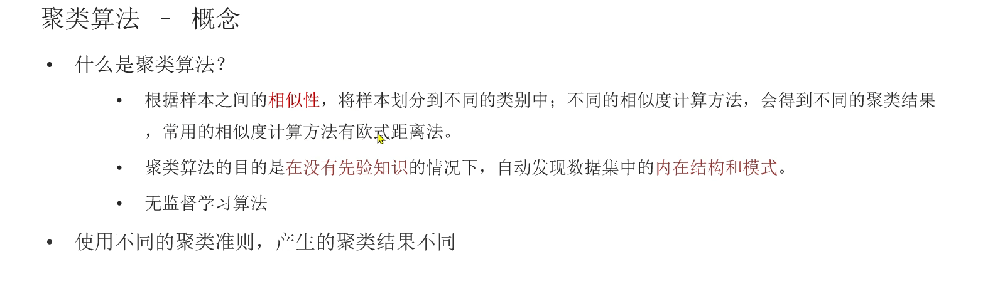

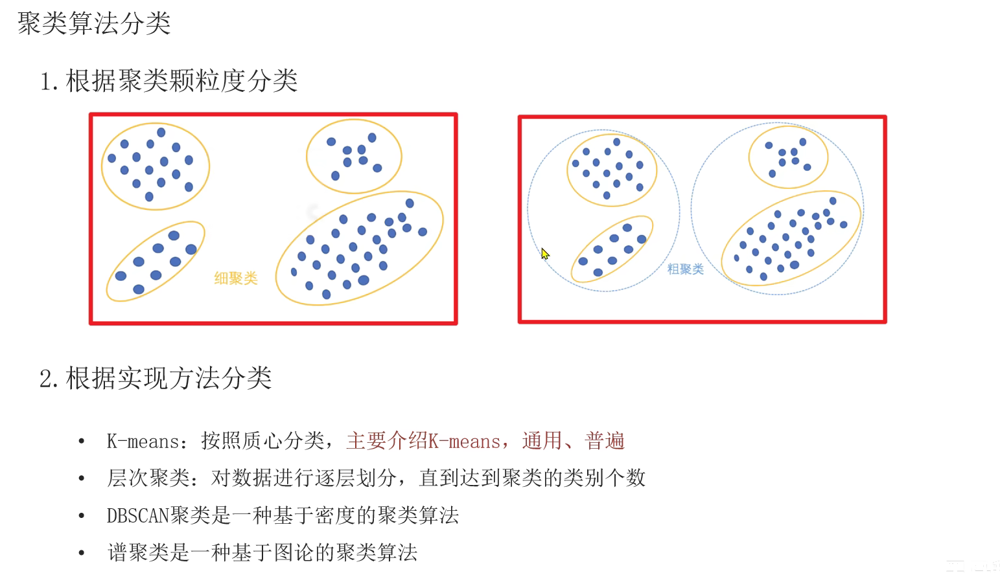

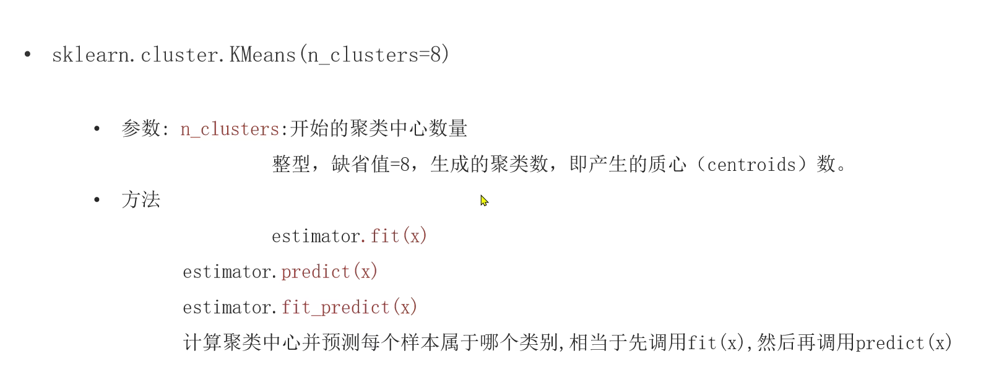

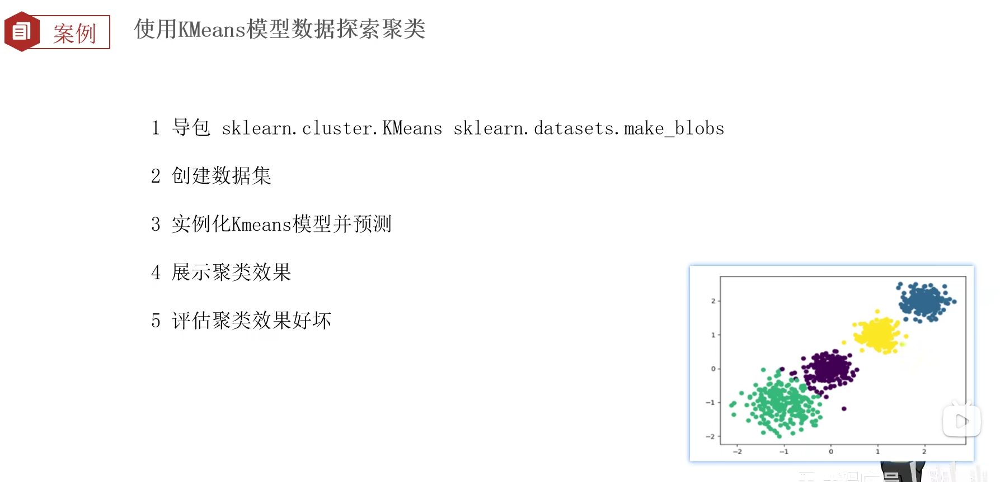

In [ ]:
"""
案例:
    演示KMeans 聚类算法 入门案例.

Kmeans简介:
    它属于 无监督学习, 即: 有特征, 无标签, 根据样本间的相似性进行划分.
    所谓的相似性 可以理解为 就是 距离, 例如: 欧式距离, 曼哈顿(城市街区)距离, 切比雪夫距离, 闵式距离...

    一般大厂, 项目初期在没有 先备知识(标签)的情况下, 可能会用.
"""
import os
os.environ['OMP_NUM_THREADS'] = '4'         # OpenMP多任务程序, 这里设置为4个线程, 防止出现线程冲突等.

# 导包
from sklearn.cluster import KMeans          # 聚类的API, 采用指定 质心 来分簇.
import matplotlib.pyplot as plt             # 绘图的
from sklearn.datasets import make_blobs     # 默认会按照高斯分布(正态分布)生成数据集, 只需要指定 均值, 标准差.
from sklearn.metrics import calinski_harabasz_score  # 评价指标, 值越大, 聚类效果越好.



# 1. 准备数据集.
# 参1: 样本数量.  参2: 样本特征数量(2列) 参3: 样本标签数量(3类)  参4: 标准差, 参5: 随机种子.
x, y = make_blobs(n_samples=1000, n_features=2, centers=[[-1,-1], [0,0], [1,1], [2,2]], cluster_std=[0.4, 0.2, 0.3, 0.4], random_state=23)
# print(x)
# print(y)

# 2. 绘制上述的图形.
# 参1: 横坐标, 参2: 纵坐标, 参3: 颜色.
plt.scatter(x[:, 0], x[:, 1])
plt.show()

# 3. 创建KMeans对象.
# 参1: 聚类数量, 参2: 随机种子.
estimator = KMeans(n_clusters=4, random_state=23)

# 4. 模型训练 和 预测.
y_pred = estimator.fit_predict(x)     # 预测值.

# 5. 绘制预测结果.
plt.scatter(x[:, 0], x[:, 1], c=y_pred)
plt.show()

# 6. 评价指标.
print(f'评价指标(评分): {calinski_harabasz_score(x, y_pred)}')    # 越大越好.